<a href="https://colab.research.google.com/github/Bhagyashree199/Bhagyashree/blob/main/HEALTH_INSURANCE_CROSS_SELL_PREDICTION_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - **Health Insurance Cross sell Prediction**



##### **Project Type**    - Classification
##### **Contribution**    - Team
##### **Team Member 1 -** MINTI JHA  (minti143jha@gmail.com)
##### **Team Member 2 -** AMIT SINGH YADAV (amitsinghbolt@gmail.com)
##### **Team Member 3 -** Sukhendra Singh(sukhendrasingh755@gmail.com)
##### **Team Member 4 -** SURAJ YADAV(syadav2539@gmail.com)
##### **Team Member 5 -** Bhagyashree Dahare(bhagyeshreedahare19@gmail.com)

# **Project Summary -**

Insurance is an agreement by which an individual obtains protection against any losses from an insurance company against the risks of damage, financial losses, damage, illness, or death in return for the payment of a specified premium. In this project, we have an insurance details dataset which contains a total of *381109 rows* and *12 features*. We have a categorical dependent variable *Response* which represents whether a customer is interested in vehicle insurance or not.
As an initial step, we checked for the null and duplicate values in our dataset. As there were no null and duplicate values present in our dataset, so data cleaning was not required. Further, we *normalized* the numerical columns for bringing them on the same scale.

In **Exploratory Data Analysis**, we categorized the Age as *YoungAge,* *MiddleAge, OldAge*.Then we categorized *Region_Code* and *Policy_Sales_Channel* to extract some valuable information from these features. We explored the independent features using some plots.

For **Feature selection**, we used Kendall's rank correlation coefficient for numerical features and for categorical features, we applied the Mutual Information technique.

For **Model prediction**, we used supervised machine learning algorithms like *Decision tree Classifier, AdaBoost, LightGBM, BaggingRegressor, NaiveBayes and Logistic regression*. Then applied hyperparameter tuning techniques to obtain better accuracy and to avoid overfitting.


# **GitHub Link -**

https://github.com/Suraj2539/Health_Insurance_Cross_sell_Prediction/blob/main/HEALTH_INSURANCE_CROSS_SELL_PREDICTION.ipynb

## **Problem Statement**
---

Our client is an Insurance company that has provided Health Insurance to its customers now they need your help in building a model to predict whether the policyholders (customers) from past year will also be interested in Vehicle Insurance provided by the company.

An insurance policy is an arrangement by which a company undertakes to provide a guarantee of compensation for specified loss, damage, illness, or death in return for the payment of a specified premium. A premium is a sum of money that the customer needs to pay regularly to an insurance company for this guarantee.

For example, you may pay a premium of Rs. 5000 each year for a health insurance cover of Rs. 200,000/- so that if, God forbid, you fall ill and need to be hospitalised in that year, the insurance provider company will bear the cost of hospitalisation etc. for upto Rs. 200,000. Now if you are wondering how can company bear such high hospitalisation cost when it charges a premium of only Rs. 5000/-, that is where the concept of probabilities comes in picture. For example, like you, there may be 100 customers who would be paying a premium of Rs. 5000 every year, but only a few of them (say 2-3) would get hospitalised that year and not everyone. This way everyone shares the risk of everyone else.

Just like medical insurance, there is vehicle insurance where every year customer needs to pay a premium of certain amount to insurance provider company so that in case of unfortunate accident by the vehicle, the insurance provider company will provide a compensation (called ‘sum assured’) to the customer.

Building a model to predict whether a customer would be interested in Vehicle Insurance is extremely helpful for the company because it can then accordingly plan its communication strategy to reach out to those customers and optimise its business model and revenue.

Now, in order to predict, whether the customer would be interested in Vehicle insurance, you have information about demographics (gender, age, region code type), Vehicles (Vehicle Age, Damage), Policy (Premium, sourcing channel) etc.

In [ ]:
#@title
!pip uninstall scikit-learn -y
!pip install -U scikit-learn

Found existing installation: scikit-learn 1.2.2
Uninstalling scikit-learn-1.2.2:
  Successfully uninstalled scikit-learn-1.2.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 19.8 MB/s eta 0:00:00


# ***Let's Begin !***

## ***1. Know Your Data***

# Importing Libraries
---

In [ ]:
#@title

# Basic
import numpy as np
import pandas as pd

# Plotation
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

# ML Models
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
import lightgbm as lgb

# Evaluation Metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import log_loss

# Hyper Parameter Tuning
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingRandomSearchCV

# Miscellaneous
import time
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

Mounting google drive


In [ ]:
#@title
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Dataset Loading

Let's read the dataset we have to work on! We have a dataset of Health Insurance details.


In [ ]:
data_df = pd.read_csv('/content/drive/MyDrive/TRAIN-HEALTH INSURANCE CROSS SELL PREDICTION.csv')

### Dataset First View

In [ ]:
data_df.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


In [ ]:
data_df.tail()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
381104,381105,Male,74,1,26.0,1,1-2 Year,No,30170.0,26.0,88,0
381105,381106,Male,30,1,37.0,1,< 1 Year,No,40016.0,152.0,131,0
381106,381107,Male,21,1,30.0,1,< 1 Year,No,35118.0,160.0,161,0
381107,381108,Female,68,1,14.0,0,> 2 Years,Yes,44617.0,124.0,74,0
381108,381109,Male,46,1,29.0,0,1-2 Year,No,41777.0,26.0,237,0


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
data_df.shape

(381109, 12)

So, In our dataset there are 381109 rows and 12 columns

### Dataset Information

In [ ]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int64  
 1   Gender                381109 non-null  object 
 2   Age                   381109 non-null  int64  
 3   Driving_License       381109 non-null  int64  
 4   Region_Code           381109 non-null  float64
 5   Previously_Insured    381109 non-null  int64  
 6   Vehicle_Age           381109 non-null  object 
 7   Vehicle_Damage        381109 non-null  object 
 8   Annual_Premium        381109 non-null  float64
 9   Policy_Sales_Channel  381109 non-null  float64
 10  Vintage               381109 non-null  int64  
 11  Response              381109 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 34.9+ MB


So, there is no duplicate values in our dataset.

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
missing_count = data_df.isnull().sum()
missing_count

id                      0
Gender                  0
Age                     0
Driving_License         0
Region_Code             0
Previously_Insured      0
Vehicle_Age             0
Vehicle_Damage          0
Annual_Premium          0
Policy_Sales_Channel    0
Vintage                 0
Response                0
dtype: int64

###There is no null values in the dataset.


### What did you know about your dataset?

The dataset consists of 381,109 customer responses regarding vehicle insurance. The dependent variable, "Response," indicates whether customers purchased the vehicle insurance subscription, with 0 representing non-purchase and 1 representing purchase. The dataset contains 11 independent variables, including integer, float, and string data types. Notably, the dataset is free from null values, missing values, and duplicates across its columns.

## ***2. Understanding Your Variables***

# Dataset Columns


In [ ]:
# Dataset Columns
data_df.columns

Index(['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response'],
      dtype='object')

In [ ]:
# Description of Dataset
data_df.describe()

,id,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Response
count,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000
mean,190555.000000,38.822584,0.997869,26.388807,0.458210,30564.389581,112.034295,154.347397,0.122563
std,110016.836208,15.511611,0.046110,13.229888,0.498251,17213.155057,54.203995,83.671304,0.327936
min,1.000000,20.000000,0.000000,0.000000,0.000000,2630.000000,1.000000,10.000000,0.000000
25%,95278.000000,25.000000,1.000000,15.000000,0.000000,24405.000000,29.000000,82.000000,0.000000
50%,190555.000000,36.000000,1.000000,28.000000,0.000000,31669.000000,133.000000,154.000000,0.000000
75%,285832.000000,49.000000,1.000000,35.000000,1.000000,39400.000000,152.000000,227.000000,0.000000
max,381109.000000,85.000000,1.000000,52.000000,1.000000,540165.000000,163.000000,299.000000,1.000000


### Variables Description

1. id :	Unique ID for the customer

2. Gender	: Gender of the customer

3. Age :	Age of the customer

4. Driving_License	0 : Customer does not have DL, 1 : Customer already has DL

5. Region_Code :	Unique code for the region of the customer

6. Previously_Insured	: 1 : Customer already has Vehicle Insurance, 0 : Customer doesn't have Vehicle Insurance

7. Vehicle_Age :	Age of the Vehicle

8. Vehicle_Damage	 :1 : Customer got his/her vehicle damaged in the past. 0 : Customer didn't get his/her vehicle damaged in the past.

9. Annual_Premium	: The amount customer needs to pay as premium in the year

10. PolicySalesChannel :	Anonymized Code for the channel of outreaching to the customer ie. Different Agents, Over Mail, Over Phone, In Person, etc.

11. Vintage :	Number of Days, Customer has been associated with the company

12. Response :	1 : Customer is interested, 0 : Customer is not interested

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
data_df.nunique()

id                      381109
Gender                       2
Age                         66
Driving_License              2
Region_Code                 53
Previously_Insured           2
Vehicle_Age                  3
Vehicle_Damage               2
Annual_Premium           48838
Policy_Sales_Channel       155
Vintage                    290
Response                     2
dtype: int64

*So, without any further delay let’s move ahead!*

# **Data Wrangling**


---



- Data wrangling is the process of cleaning and unifying messy and complex data sets for easy access and analysis.

- This process typically includes manually converting and mapping data from one raw form into another format to allow for more convenient consumption and organization of the data.

*Let's dive into the dataset!*

**Checking for Duplicate Data:**

In [ ]:
data_df[data_df.duplicated()]

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response


**Checking for Null Values:**

In [ ]:
data_df.isna().sum()

id                      0
Gender                  0
Age                     0
Driving_License         0
Region_Code             0
Previously_Insured      0
Vehicle_Age             0
Vehicle_Damage          0
Annual_Premium          0
Policy_Sales_Channel    0
Vintage                 0
Response                0
dtype: int64

### **Observations:**
---
- As we can see, our data set contains 381109 rows and 12 columns.
- We do not have any **Null Values** in our dataset.


## **Data Cleaning and Refactoring**
---
Let's reformat and clean the data for smooth processing!

### **Finding Outliers**
---
*Let's take a look at the outliers (if any) in our dataset.*

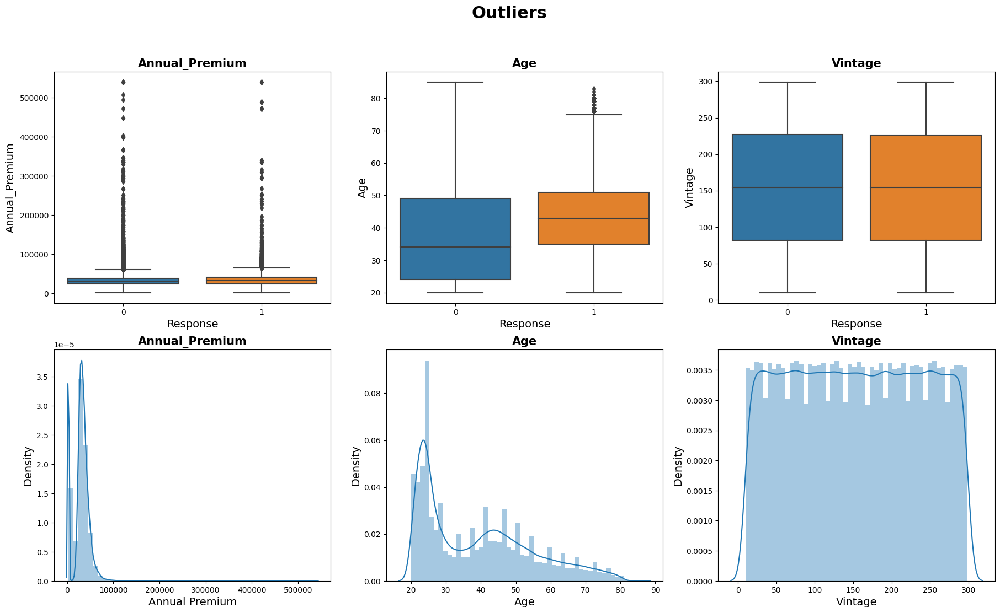

In [ ]:
def show_outliers(df):

    fig, axes = plt.subplots(2, 3, figsize=(22,12))

    sns.boxplot(ax = axes[0][0],y = 'Annual_Premium',x = 'Response', data = df)
    axes[0][0].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0][0].set_ylabel(ylabel = 'Annual_Premium', fontdict={'fontsize': 14})
    axes[0][0].set_title('Annual_Premium', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.boxplot(ax = axes[0][1],y = 'Age',x = 'Response', data = df)
    axes[0][1].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0][1].set_ylabel(ylabel = 'Age', fontdict={'fontsize': 14})
    axes[0][1].set_title('Age', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.boxplot(ax = axes[0][2],y = 'Vintage',x = 'Response', data = df)
    axes[0][2].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0][2].set_ylabel(ylabel = 'Vintage', fontdict={'fontsize': 14})
    axes[0][2].set_title('Vintage', fontdict={'fontsize': 15,  'fontweight' :'bold'})


    sns.distplot(ax = axes[1][0],x = df['Annual_Premium'])
    axes[1][0].set_xlabel(xlabel = 'Annual Premium', fontdict={'fontsize': 14})
    axes[1][0].set_ylabel(ylabel = 'Density', fontdict={'fontsize': 14})
    axes[1][0].set_title('Annual_Premium', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.distplot(ax = axes[1][1],x = df['Age'])
    axes[1][1].set_xlabel(xlabel = 'Age', fontdict={'fontsize': 14})
    axes[1][1].set_ylabel(ylabel = 'Density', fontdict={'fontsize': 14})
    axes[1][1].set_title('Age', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.distplot(ax = axes[1][2],x = df['Vintage'])
    axes[1][2].set_xlabel(xlabel = 'Vintage', fontdict={'fontsize': 14})
    axes[1][2].set_ylabel(ylabel = 'Density', fontdict={'fontsize': 14})
    axes[1][2].set_title('Vintage', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    plt.suptitle('Outliers', fontsize = 22, fontweight = 'bold' )

show_outliers(data_df)

*   From the above plot it can be implied that **Annual Premium** has a poitively skewed distribution.
*   From above we can also depict that **Vintage** has a approximatly uniform distribution.
* **Age** columns has some outliers but we are not going to treat them because it won't be affecting our result.


## **Outlier Treatment and Feature Scaling**


---

*   For Outlier treatment we will be applying quantile method.
*   For feature Scaling we will be using MinMaxScaler technique for Normlization.

In [ ]:
def outlier_treatment(df):
    Q1=df['Annual_Premium'].quantile(0.25)
    Q3=df['Annual_Premium'].quantile(0.75)
    IQR=Q3-Q1

    Lower_Whisker = Q1-1.5*IQR
    Upper_Whisker = Q3+1.5*IQR
    df['Annual_Premium_Treated'] = np.where(df['Annual_Premium']>Upper_Whisker, Upper_Whisker, df['Annual_Premium'])

def scale_features(df):
    scaler = MinMaxScaler()

    df['Annual_Premium_Treated'] = scaler.fit_transform(df['Annual_Premium_Treated'].values.reshape(-1,1))
    df['Vintage_Treated'] = scaler.fit_transform(df['Vintage'].values.reshape(-1,1))

outlier_treatment(data_df)
scale_features(data_df)

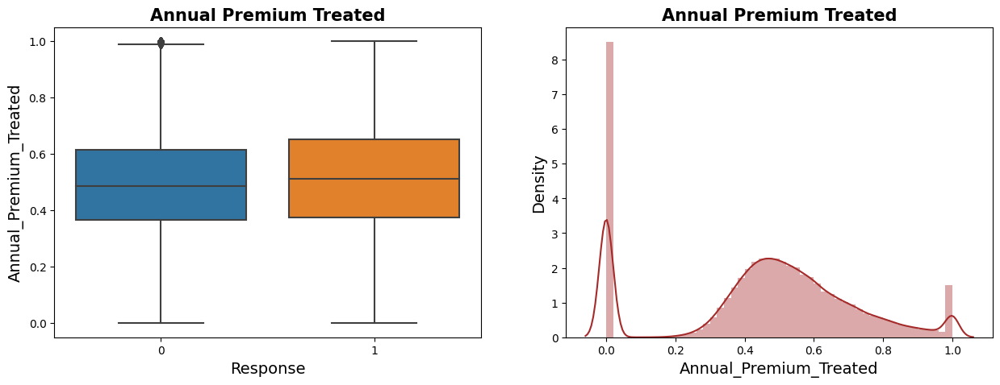

In [ ]:
def show_ann_prem_outliers(df):

    fig, axes = plt.subplots(1, 2, figsize=(15,5))
    sns.boxplot(ax = axes[0], y = 'Annual_Premium_Treated',x = 'Response', data = df)
    axes[0].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[0].set_title('Annual Premium Treated', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.distplot(ax = axes[1], x = df['Annual_Premium_Treated'], color='brown')
    axes[1].set_xlabel(xlabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1].set_ylabel(ylabel = 'Density', fontdict={'fontsize': 14})
    axes[1].set_title('Annual Premium Treated', fontdict={'fontsize': 15,  'fontweight' :'bold'})


show_ann_prem_outliers(data_df)

*   From the above plots we can see that there are no more outliers in *Annual Premium*.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

# **Exploratory Data Analysis**
---


#### Chart - 1 Exploring the Numerical Features

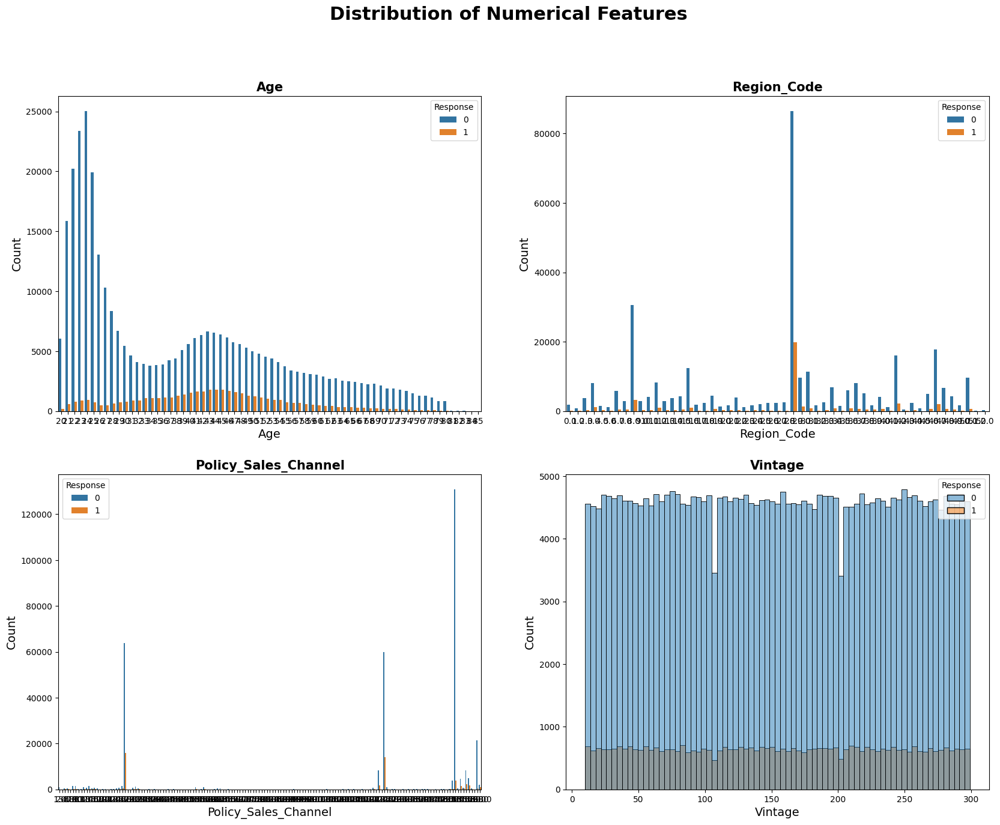

In [ ]:
def show_distribution_numerical_features(df):
    fig, axes = plt.subplots(2,2, figsize=(20,15))

    sns.countplot(ax = axes[0][0],x = 'Age', data = df, hue='Response')
    axes[0][0].set_xlabel(xlabel = 'Age', fontdict={'fontsize': 14})
    axes[0][0].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[0][0].set_title('Age', fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.countplot(ax = axes[0][1],x = 'Region_Code', data = df, hue='Response')
    axes[0][1].set_xlabel(xlabel = 'Region_Code', fontdict={'fontsize': 14})
    axes[0][1].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[0][1].set_title('Region_Code',fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.countplot(ax = axes[1][0],x = 'Policy_Sales_Channel', data = df, hue='Response')
    axes[1][0].set_xlabel(xlabel = 'Policy_Sales_Channel', fontdict={'fontsize': 14})
    axes[1][0].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[1][0].set_title('Policy_Sales_Channel',fontdict={'fontsize': 15,  'fontweight' :'bold'})

    sns.histplot(ax = axes[1][1], x = data_df['Vintage'],data = df, hue='Response')
    axes[1][1].set_xlabel(xlabel = 'Vintage', fontdict={'fontsize': 14})
    axes[1][1].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[1][1].set_title('Vintage',fontdict={'fontsize': 15,  'fontweight' :'bold'})

    plt.suptitle('Distribution of Numerical Features', fontsize = 22, fontweight = 'bold' )
show_distribution_numerical_features(data_df)

##### 1. Why did you pick the specific chart?

1 We have pick 'count plot' to count categorical values like:- 'Age', 'Region_Code', and 'Policy_Sales_Channel'. and also we picked histplot to visualize continuous variables like:- ' vintage'.

##### 2. What is/are the insight(s) found from the chart?

The first plot shows the count of individuals at different ages, grouped by the 'Response' category.

The second plot displays the count of individuals from different regions, with 'Response' categories distinguished by colors.

The third plot shows the count of individuals based on the policy sales channels they used, grouped by 'Response'.

The fourth plot presents a histogram of the 'Vintage' feature, which likely represents how long customers have been associated with the insurance company.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Age: By visualizing the distribution of age with respect to the response variable, we can identify any age groups that are more likely to respond positively or negatively to a certain campaign or offer.

Region_Code: Analyzing the distribution of region codes in relation to the response variable can uncover geographic patterns or preferences. It can help identify regions where the response rate is high or low.

Policy_Sales_Channel: Understanding the distribution of policy sales channels and their impact on the response variable can provide insights into the effectiveness of different channels for customer acquisition or retention. Businesses can optimize their sales and marketing strategies by allocating resources to the most successful channels.

Vintage: The distribution of vintage (the number of days the customer has been associated with the company) can indicate customer loyalty or engagement. By analyzing the distribution and its relationship with the response variable, businesses can gain positive insights.

**Negative growth**

Customers in a particular region are more likely to churn (cancel their policies). This could lead to negative growth if the company does not take steps to address the issue. For example, the company could try to understand why customers in this region are churning and then take steps to address the underlying issues.

Customers who purchase policies through a certain channel are less likely to renew. This could lead to negative growth if the company does not focus its sales efforts on other channels. For example, the company could try to understand why customers are less likely to renew through this channel and then take steps to improve the channel.

#### Chart - 2

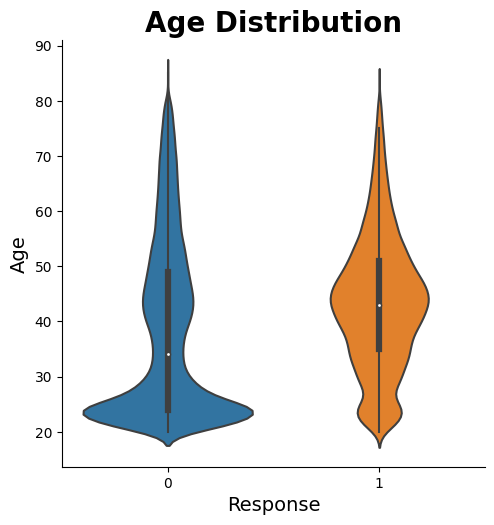

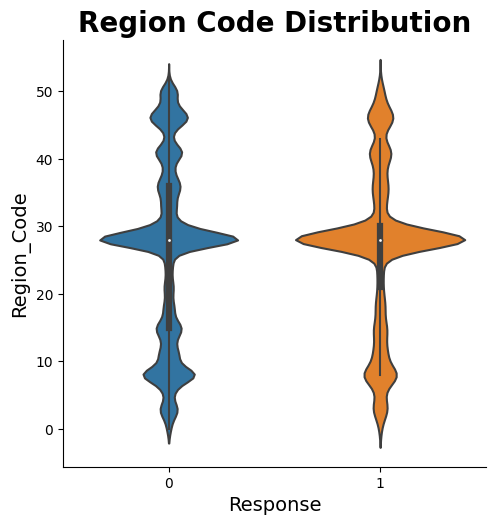

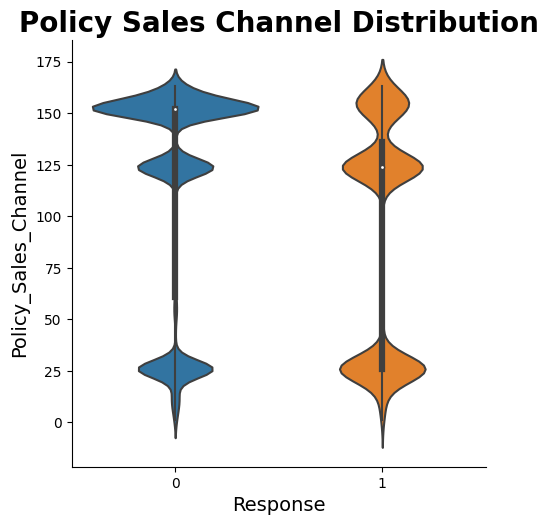

In [ ]:
def show_violin_distribution(df):

    sns.catplot(y = 'Age', data = df, x='Response', kind = 'violin')
    plt.xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    plt.ylabel(ylabel = 'Age', fontdict={'fontsize': 14})
    plt.title('Age Distribution', fontdict={'fontsize': 20, 'fontweight':'bold'})

    sns.catplot(y = 'Region_Code', data = df, x='Response', kind = 'violin')
    plt.xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    plt.ylabel(ylabel = 'Region_Code', fontdict={'fontsize': 14})
    plt.title('Region Code Distribution', fontdict={'fontsize': 20, 'fontweight':'bold'})

    sns.catplot(y = 9876543'Policy_Sales_Channel', data = df, x='Response', kind = 'violin')
    plt.xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    plt.ylabel(ylabel = 'Policy_Sales_Channel', fontdict={'fontsize': 14})
    plt.title('Policy Sales Channel Distribution', fontdict={'fontsize': 20, 'fontweight':'bold'})
show_violin_distribution(data_df)

##### 1. Why did you pick the specific chart?

Q1 we choose the violin plot because it is a good way to visualize the distribution of a variable for two or more groups(response or no response). The violin plot shows the shape of the distribution, as well as the median, quartiles, and outliers.  

##### 2. What is/are the insight(s) found from the chart?


As we can see, we have a huge dispersion of data in Age feature, so in order to gain better insights on Age feature, we can convert it into categories as YoungAge, MiddleAge and OldAge.

Similarly, we can also categorize Region Code and Policy_Sales_Channel.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The violin plot for Age shows that the "Response" group has a wider distribution than the "No Response" group. This means that there is more variation in the ages of people who responded to the survey. This information could be used to target marketing campaigns to specific age groups.

The violin plot for Region_Code shows that the "Response" group is more evenly distributed across the different regions than the "No Response" group. This means that people from all regions are equally likely to respond to the survey. This information could be used to allocate marketing resources more evenly across different regions.

The violin plot for Policy_Sales_Channel shows that the "Response" group is more likely to have purchased their policy through a direct sales channel than through an agent. This information could be used to increase the number of policies sold through direct sales channels.

**Negative growth**

The violin plot for Age shows that the "No Response" group has a higher median age than the "Response" group. This means that older people are less likely to respond to surveys. This could be a problem if the company is targeting older people with their products or services.

The violin plot for Region_Code shows that the "No Response" group is more heavily concentrated in certain regions than the "Response" group. This means that the company may be missing out on potential customers in these regions.

#### Chart - 3

In [ ]:
def show_distribution_num_to_cat(df):
    fig, axes = plt.subplots(1,3, figsize=(22,5))

    sns.countplot(ax = axes[0],x = 'Age_Group', data = df, hue='Response')
    axes[0].set_xlabel(xlabel = 'Age_Group', fontdict={'fontsize': 14})
    axes[0].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[0].set_title('Age', fontdict={'fontsize': 15})

    sns.countplot(ax = axes[1],x = 'Region_Code_Categorical', data = df, hue='Response')
    axes[1].set_xlabel(xlabel = 'Region_Code_Categorical', fontdict={'fontsize': 14})
    axes[1].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[1].set_title('Region_Code',fontdict={'fontsize': 15})

    sns.countplot(ax = axes[2],x = 'Policy_Sales_Channel_Categorical', data = df, hue='Response')
    axes[2].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[2].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[2].set_title('Policy_Sales_Channel',fontdict={'fontsize': 15})

    plt.suptitle('Distribution of Categorical Features', fontsize = 22, fontweight = 'bold' )


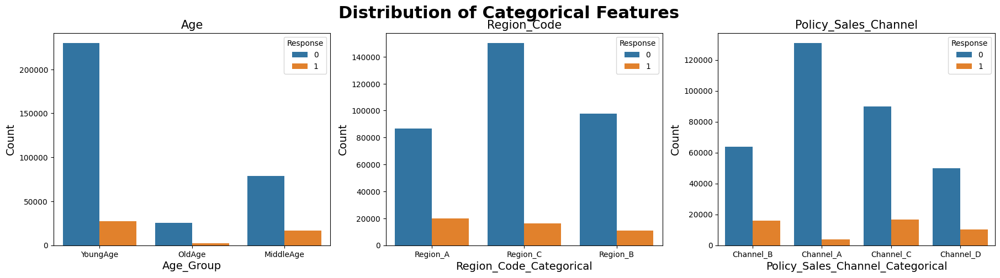

In [ ]:
show_distribution_num_to_cat(data_df)

In [ ]:
data_df.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response,Annual_Premium_Treated,Vintage_Treated,Age_Group,Policy_Sales_Channel_Categorical,Region_Code_Categorical
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1,0.638245,0.716263,YoungAge,Channel_B,Region_A
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0,0.521510,0.598616,OldAge,Channel_B,Region_C
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1,0.601797,0.058824,MiddleAge,Channel_B,Region_A
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0,0.438540,0.667820,YoungAge,Channel_A,Region_C
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0,0.419591,0.100346,YoungAge,Channel_A,Region_B


##### 1. Why did you pick the specific chart?

We picked the countplot chart because it is a simple and effective way to visualize the distribution of categorical data. The countplot shows the number of observations for each category, and it can be used to compare the distributions of different categories.       

##### 2. What is/are the insight(s) found from the chart?

We can see that Customers belonging to YoungAge group are more likely not interested in taking the vehicle insurance.

Similarly, Region_C and Channel_A Customers has the highest chances of not taking the vehicle insurance.



##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Identify new target markets. The insights on age and region code can help the company to identify new target markets for its products or services.

Improve its response rates. The insights on policy sales channel can help the company to improve its response rates through the Online channel and the Agency channel.

Increase customer satisfaction. The insights on age and region code can help the company to identify areas where it can improve customer satisfaction.

There are no insights that would lead to negative growth. However, there are some insights that could lead to missed opportunities if they are not acted upon. For example, the company could miss out on a significant market opportunity if it does not focus its marketing efforts on the 18-24 and 45-54 age groups

#### Chart - 4 Gender Distribution

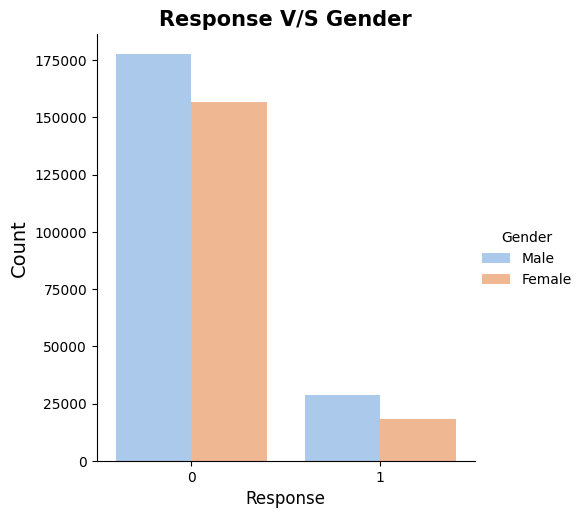

In [ ]:
def show_gender_response_relation(df):
    sns.catplot(x="Response", hue="Gender", kind="count",
                palette="pastel",
                data=df)
    plt.xlabel('Response', fontdict={'fontsize':12})
    plt.ylabel('Count',fontdict={'fontsize': 14})
    plt.title('Response V/S Gender', fontdict={'fontsize': 15, 'fontweight':'bold'})

show_gender_response_relation(data_df)

##### 1. Why did you pick the specific chart?

We picked the catplot() function from library because it is a good way to visualize the relationship between two categorical variables. In this case, the two categorical variables are Response and Gender.

##### 2. What is/are the insight(s) found from the chart?

For the above plot, we can say that the no. of male customers in our data set is higher than female customers.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Target marketing campaigns more effectively. The insight could be used to identify which gender is more likely to respond to a particular marketing campaign. This information could then be used to target the campaign to the appropriate gender.

Develop new products or services. The insight used to identify unmet needs or desires among different genders. This information could then be used to develop new products or services that appeal to these needs or desires.

Improve customer service. This insight used to identify areas where customer service could be improved for different genders. This information could then be used to make changes to the customer service process to improve the experience for all genders.

**Negative growth**

Gender Bias: If the insights are used to perpetuate gender stereotypes or discrimination, it could lead to negative public perception and backlash against the business.

Data Misinterpretation: Without proper statistical analysis and context, the relationships observed in the visualization may not be meaningful or significant. Making decisions based on misleading insights could harm business performance.

#### Chart - 5 Exploring the Age Feature

In [ ]:
def show_age_relations(df):
    fig, axes = plt.subplots(1,3, figsize=(25,8))
    sns.countplot(ax = axes[0],x="Response", hue="Age_Group", palette="pastel",
            data=df)
    axes[0].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[0].set_title('Age_Group', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.histplot(ax = axes[1],binwidth=0.5, x="Age_Group",
                 hue="Previously_Insured", data=df,
                 stat="count", multiple="stack")
    axes[1].set_xlabel(xlabel = 'Age_Group', fontdict={'fontsize': 14})
    axes[1].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[1].set_title('Age_Group V/S Previously_Insured', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.lineplot(ax = axes[2], x="Age",y="Annual_Premium_Treated",
                 data=df,hue="Gender")
    axes[2].set_xlabel(xlabel = 'Age', fontdict={'fontsize': 14})
    axes[2].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[2].set_title('Age V/S Annual Premium Treated', fontdict={'fontsize': 15, 'fontweight':'bold'})

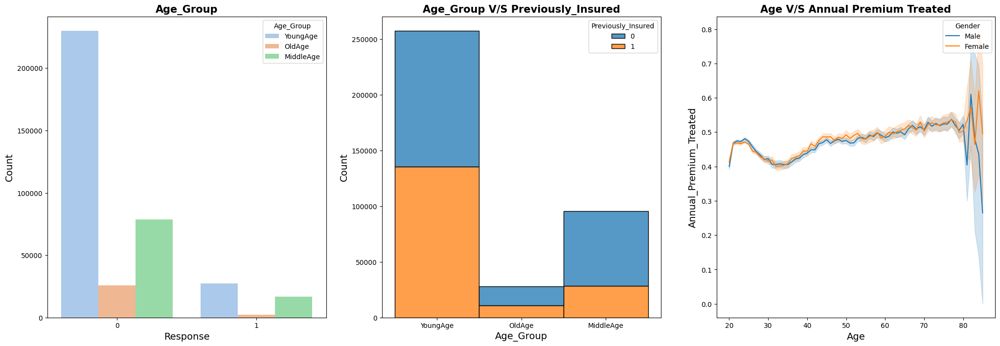

In [ ]:
show_age_relations(data_df)

##### 1. Why did you pick the specific chart?

We picked the specific chart because it shows the relationship between age and annual premium treated, while taking gender into account. This is an important relationship to understand, as it can help us to determine how age and gender affect the cost of insurance.     

##### 2. What is/are the insight(s) found from the chart?

From the first plot, we can see the Responses received from the different Age_Group.

Second plot shows the number of customers of different age group having or not having vehicle insurance.

We can say that the customers of YoungAge and OldAge are equally likely to have/not have vehicle insurance whereas customers of MiddleAge has the highest chances of not having a previously insured vehicle insurance.

From the third plot, we can see the relation between Age and their Annual_Premium for both Male and Female customers.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Targeted Marketing: The countplot showing the distribution of responses across age groups can help the business identify which age groups are more interested in their products or services. This information can lead to more targeted marketing strategies.

Insurance Strategy: The stacked histogram (axes[1]) displaying the distribution of age groups and their insurance status can be crucial in shaping insurance strategies. For instance, if a particular age group is found to have a higher proportion of previously uninsured individuals, the business can focus on creating attractive insurance packages.

Pricing and Gender Preferences: The line plot (axes[2]) showing the relationship between age, annual premium, and gender can provide insights into pricing strategies. If there are clear patterns where a certain gender prefers lower premiums at certain ages, the business can adjust their pricing models accordingly to cater to different customer preferences.

**Negative growth**

 If the annual premium treated is too high, customers may be less likely to purchase insurance.

If the annual premium treated is too different for different groups of customers, it may lead to discrimination.

If the annual premium treated is not based on accurate risk factors, it may lead to financial losses for the insurance company.

#### Chart - 6 Exploring Vehicle Damage

In [ ]:
def vehicle_damage_distribution(df):
    fig = px.pie(df, values='Response', names='Vehicle_Damage', title='Vehicle Damage Distribution')
    fig.show()
vehicle_damage_distribution(data_df)

##### 1. Why did you pick the specific chart?

This pie chart choosed for the distribution of vehicle damages.

##### 2. What is/are the insight(s) found from the chart?

Pie plot shows the number of customers whose vehicle are damaged/not damaged and they took the insurance.

From the first point plot, we can say that the chances of taking a vehicle insurance is higher if vehicle is damaged irrespective of VehicleAge group. With the increase in vehicle age, the chances of taking vehicle insurance also increases.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

 Understanding Customer Preferences: The pie chart can reveal the distribution of vehicle damage types, which can be valuable in understanding customer preferences and demands. With this information, businesses can tailor their services and products to meet customer needs more effectively.

Targeted Marketing and Promotions: Knowing the predominant vehicle damage types can help businesses design targeted marketing and promotional campaigns to attract customers who are more likely to require their services, leading to increased sales and customer engagement.

Service Improvement: By analyzing the distribution, businesses may identify trends in vehicle damage, allowing them to develop new services or improve existing ones to address common issues. This can lead to higher customer satisfaction and loyalty.

**Negative growth**

Risk Assessment: If the data reveals that certain types of vehicle damages are more frequent and costly to repair, it may raise concerns for insurance providers or businesses involved in the automotive industry.

Quality and Safety Concerns: If a specific type of vehicle damage dominates the distribution, it could indicate underlying quality or safety issues with certain vehicle models or parts.

#### Chart - 7 Exploring Vehicle Age Feature

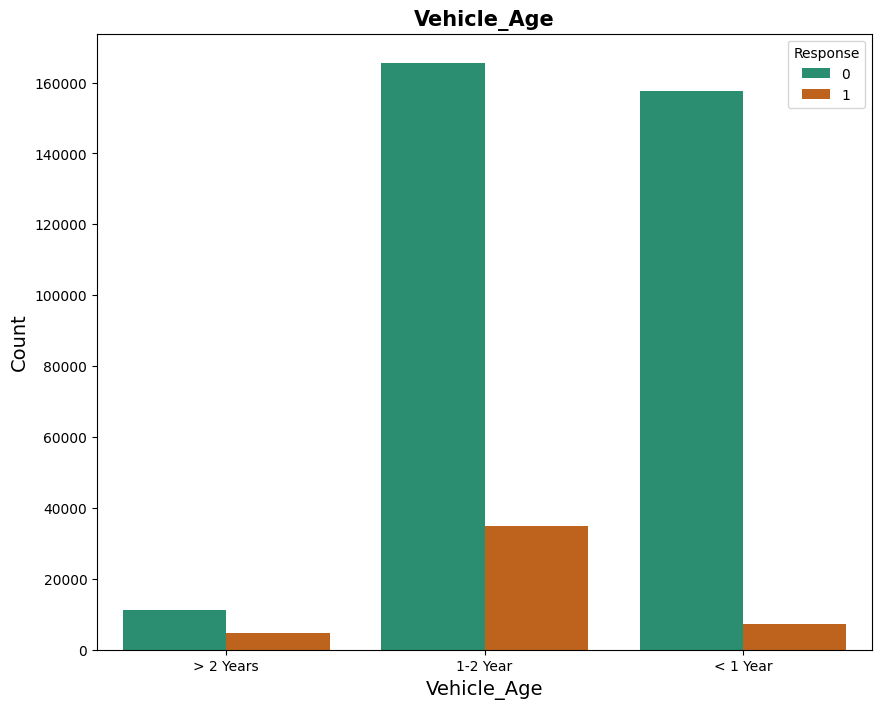

In [ ]:
def vehicle_age_distribution(df):
    plt.figure(figsize=(10, 8))
    sns.countplot(x = 'Vehicle_Age', hue='Response', data = df, palette="Dark2")
    plt.xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    plt.ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    plt.title('Vehicle_Age', fontdict={'fontsize': 15, 'fontweight':'bold'})

vehicle_age_distribution(data_df)

##### 1. Why did you pick the specific chart?

 We choose this chart because it is a good way to visualize the distribution of vehicle ages and the relationship between vehicle age and damage.     

##### 2. What is/are the insight(s) found from the chart?

 The distribution of vehicle ages is not evenly distributed. There are more vehicles that are 0-2 years old than there are vehicles in any other age category.

 The likelihood of a vehicle being damaged is not evenly distributed across the different age categories. The likelihood of a vehicle being damaged increases with age.    


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Target marketing campaigns more effectively. Businesses could use the insights to target marketing campaigns to specific age categories of vehicles. This could help businesses reach their target audience and increase sales.

Offer discounts on insurance. Businesses could offer discounts on insurance to older vehicles. This could help businesses attract new customers and increase revenue.

Develop new products or services. Businesses could develop new products or services that are specifically designed for older vehicles. This could help businesses meet the needs of their customers and increase sales.

**Negative growth**

Neglected Customer Segments:: If the chart shows that certain 'Vehicle_Age' categories have consistently poor response outcomes, there is a risk of neglecting those customer segments. Ignoring these segments could lead to dissatisfied customers, negative word-of-mouth, and potential loss of market share.

Ineffective Marketing: While targeted marketing can be beneficial, if the insights are misinterpreted or applied too broadly, businesses might allocate resources inefficiently. For example, marketing efforts directed at a specific vehicle age group may not resonate well with customers if they overlook other critical factors influencing their decisions.

#### Chart - 8

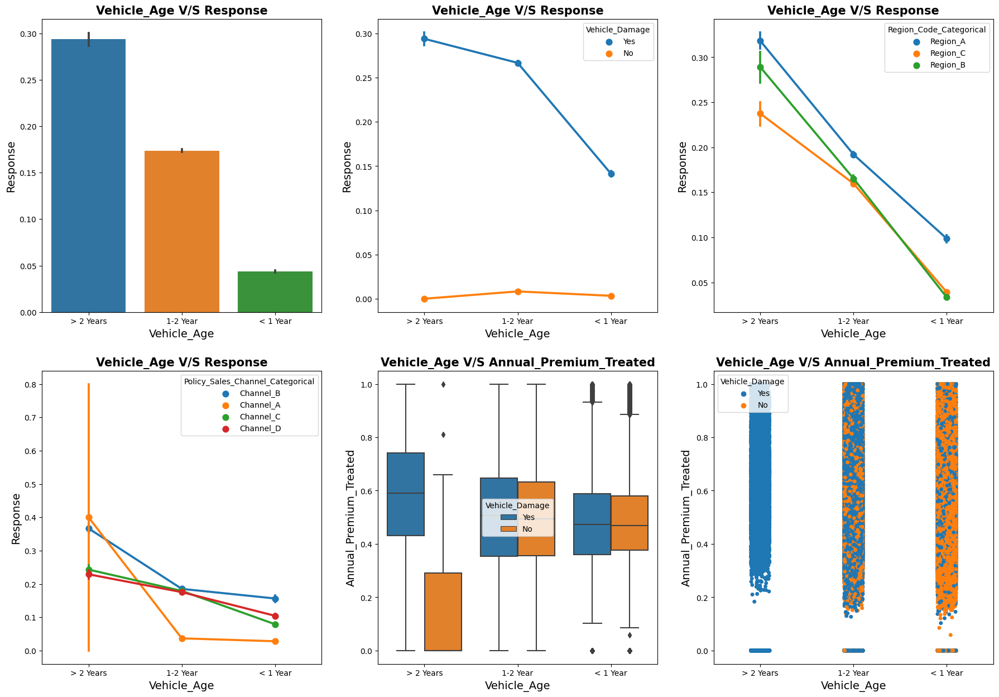

In [ ]:
def show_vehicle_age_relation(df):
    fig, axes = plt.subplots(2,3, figsize=(22,15))

    sns.barplot(ax = axes[0][0], x = 'Vehicle_Age', y='Response', data = df)
    axes[0][0].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[0][0].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[0][0].set_title('Vehicle_Age V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.pointplot(ax = axes[0][1], y = 'Response', x = 'Vehicle_Age', hue = 'Vehicle_Damage', data=df)
    axes[0][1].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[0][1].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[0][1].set_title('Vehicle_Age V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.pointplot(ax = axes[0][2], y = 'Response', x = 'Vehicle_Age', hue = 'Region_Code_Categorical', data=df)
    axes[0][2].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[0][2].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[0][2].set_title('Vehicle_Age V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.pointplot(ax = axes[1][0], y = 'Response', x = 'Vehicle_Age', hue = 'Policy_Sales_Channel_Categorical', data=df )
    axes[1][0].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[1][0].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[1][0].set_title('Vehicle_Age V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.boxplot(ax = axes[1][1], y = 'Annual_Premium_Treated', x = 'Vehicle_Age', hue = 'Vehicle_Damage', data=df )
    axes[1][1].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[1][1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1][1].set_title('Vehicle_Age V/S Annual_Premium_Treated', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.stripplot(ax = axes[1][2], y = 'Annual_Premium_Treated', x = 'Vehicle_Age', hue = 'Vehicle_Damage', data=df )
    axes[1][2].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[1][2].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1][2].set_title('Vehicle_Age V/S Annual_Premium_Treated', fontdict={'fontsize': 15, 'fontweight':'bold'})

show_vehicle_age_relation(data_df)

##### 1. Why did you pick the specific chart?

These specific charts were likely chosen because they provide different perspectives and insights into the relationship between "Vehicle_Age" and "Response," as well as how other categorical variables like "Vehicle_Damage," "Region_Code_Categorical," and "Policy_Sales_Channel_Categorical" impact this relationship.   

##### 2. What is/are the insight(s) found from the chart?

From the first bar plot, we can see the number of customers of *VehicleAge* group, took/didn't take the vehicle insurance.

- The first two plots of the above grid shows the possibility of taking vehicle insurance belonging to a particular *VehicleAge* group.

- The third plot of the above grid shows the possibility of taking vehicle insurance belonging to a particular *VehicleAge* group based on their RegionCode.

- The fourth plot of the above grid shows the possibility of taking vehicle insurance belonging to a particular *VehicleAge* group based on their *PolicySalesChannel* group.

- From the box plot of the above grid, we can see the relation of Vehicle_Age group and Annual_Premium based on their Vehicle_Damage response.
- The strip plot shows that the customers having vehicle age >2 Years have the higher chances of taking vehicle insurance.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The analysis of "Vehicle_Age" and "Response" can help identify patterns in customer behavior based on the age of their vehicles. This understanding can be utilized to tailor marketing strategies and offers based on the preferences and needs of different customer segments.

By analyzing the response variation across different vehicle age groups, insurance companies can identify which types of insurance products are more appealing to customers with older or newer vehicles.

The analysis of "Annual_Premium_Treated" in relation to "Vehicle_Age" and "Vehicle_Damage" can provide valuable information for optimizing pricing strategies. Insurance companies can adjust premium rates based on the risk associated with different vehicle age categories and whether the vehicle has experienced damage in the past.

**Negative Growth**

If the analysis reveals that certain vehicle age groups consistently face higher premium rates (e.g., older vehicles), it may lead to negative customer perception or dissatisfaction. This could result in higher churn rates or difficulty attracting new customers in those segments.

dentifying certain vehicle age groups that consistently show low response rates may indicate that the company's insurance offerings for those segments are not attractive or financially viable. This insight may prompt a reevaluation of product offerings in those categories.

#### Chart - 9 Exploring Annual Premium

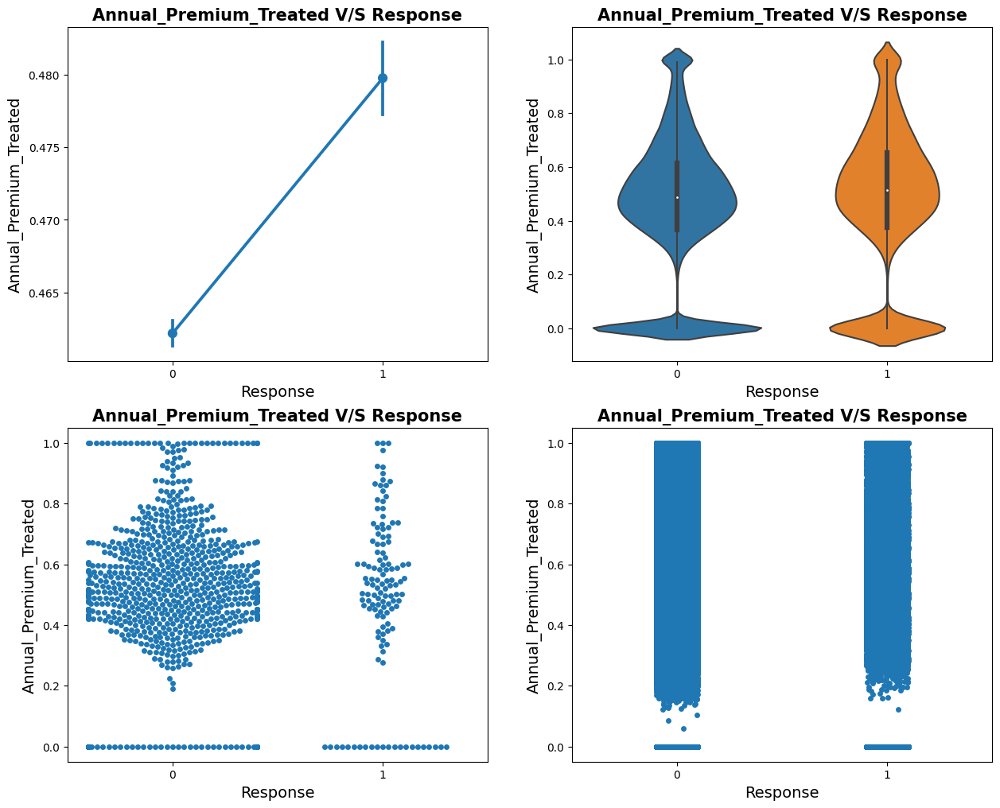

In [ ]:
def show_annual_premium_relation(df):
    fig, axes = plt.subplots(2,2, figsize=(15,12))

    sns.pointplot(ax = axes[0][0], x = 'Response', y = 'Annual_Premium_Treated', data = df)
    axes[0][0].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0][0].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[0][0].set_title('Annual_Premium_Treated V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.violinplot(ax = axes[0][1], x = 'Response', y = 'Annual_Premium_Treated', data = df)
    axes[0][1].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0][1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[0][1].set_title('Annual_Premium_Treated V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.swarmplot(ax = axes[1][0], x = 'Response', y = 'Annual_Premium_Treated', data = df[:1000])
    axes[1][0].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[1][0].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1][0].set_title('Annual_Premium_Treated V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.stripplot(ax = axes[1][1], x = 'Response', y = 'Annual_Premium_Treated', data = df)
    axes[1][1].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[1][1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1][1].set_title('Annual_Premium_Treated V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

show_annual_premium_relation(data_df)

##### 1. Why did you pick the specific chart?

We choose these charts(Pointplot,Violinplot,Swarmplot,Stripplot) because this good way to show the distribution of data for two variables.    

##### 2. What is/are the insight(s) found from the chart?

From the point plot, we can say that if the Annual_Premium is more then they are more likely to take the vehicle insurance.

Second plot also shows the same thing with violin plot.

Third plot shows the plattern of responses based on Annual_Premium.

Fourth plot is the strip plot for Annual_Premium and Responses.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Identify opportunities to increase premiums. The charts show that there is a positive relationship between annual premium and response. This means that businesses could potentially increase their premiums without seeing a decrease in response.

Identify opportunities to target specific segments. The charts show that there are differences in the mean annual premium for each response value. This means that businesses could potentially target specific segments of their customers with different premiums.

Improve their pricing strategy. The insights from the charts could help businesses to improve their pricing strategy by better understanding the relationship between annual premium and response.

**Negative growth**

Overpricing or Underpricing: Misinterpreting the visualizations might lead to overpricing or underpricing insurance products for certain response categories. Overpricing may result in customer churn, while underpricing could lead to revenue loss or inadequate coverage.

Neglecting Other Important Factors: The analysis focuses on the relationship between Response and Annual_Premium_Treated, but other relevant variables might be ignored. Neglecting crucial factors could lead to incomplete decision-making and missed growth opportunities.

#### Chart - 10 Annual Premium and Age

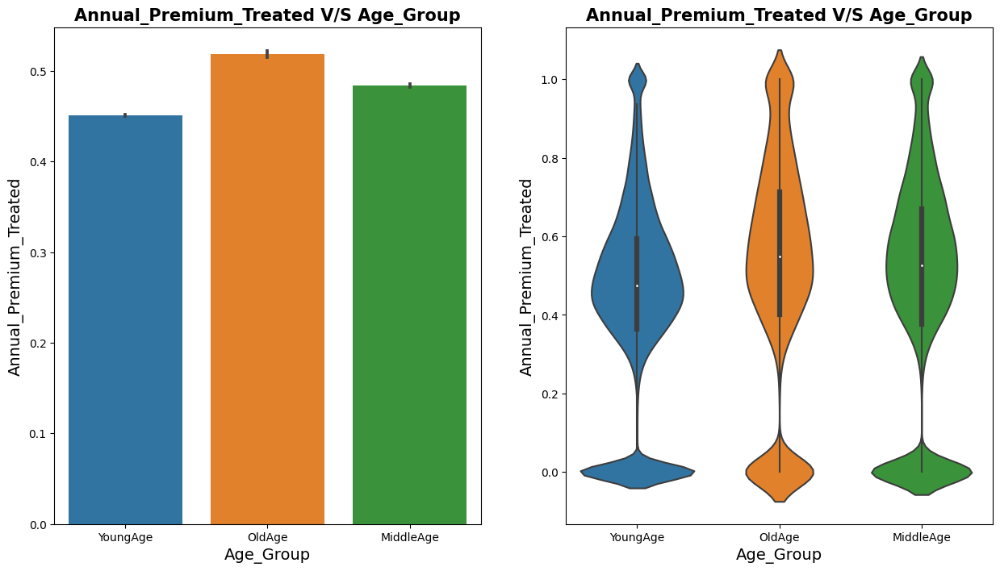

In [ ]:
def show_annual_premium_with_age_group(df):
    fig, axes = plt.subplots(1,2, figsize=(15,8))

    sns.barplot(ax = axes[0],y = 'Annual_Premium_Treated', x = 'Age_Group', data= data_df)
    axes[0].set_xlabel(xlabel = 'Age_Group', fontdict={'fontsize': 14})
    axes[0].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[0].set_title('Annual_Premium_Treated V/S Age_Group', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.violinplot(ax = axes[1], y = 'Annual_Premium_Treated', x = 'Age_Group', data= df)
    axes[1].set_xlabel(xlabel = 'Age_Group', fontdict={'fontsize': 14})
    axes[1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1].set_title('Annual_Premium_Treated V/S Age_Group', fontdict={'fontsize': 15, 'fontweight':'bold'})

show_annual_premium_with_age_group(data_df)

##### 1. Why did you pick the specific chart?

We picked the barplot and violin plot because they are both effective ways to visualize the relationship between annual premium and age group.  

##### 2. What is/are the insight(s) found from the chart?

The bar plot allows us to compare the average annual premiums for different age groups. We can observe which age group tends to have higher or lower annual premiums. It can help identify any trends or differences in premiums based on age.

The violin plot helps us understand the distribution of annual premiums within each age group. It shows the spread of data, including the median, quartiles, and any potential outliers. This can provide insights into the variability of annual premiums for different age groups.  

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**Targeted Marketing and Pricing Strategies**:  Understanding the relationship between age groups and annual premiums can help insurance companies develop targeted marketing strategies.

**Risk Assessment and Underwriting**: Insurance companies can use these insights to refine their risk assessment and underwriting processes. If specific age groups have higher risks, the company can adjust premiums or coverage options accordingly, ensuring a balanced risk portfolio.

**Customer Segmentation**: By identifying different age groups' premium patterns, insurance companies can segment their customer base. This segmentation can lead to personalized offerings and services, enhancing customer satisfaction and loyalty.

**Negative growth**

If the insights lead to a disproportionate increase in premiums for certain age groups, it may raise concerns about age discrimination. This could lead to legal issues, public backlash, and damage to the company's reputation.

If the insights are not acted upon in a fair and transparent manner, customers may feel unfairly treated. This could result in a loss of trust and loyalty, leading to customer churn and negative word-of-mouth.

#### Chart - 11

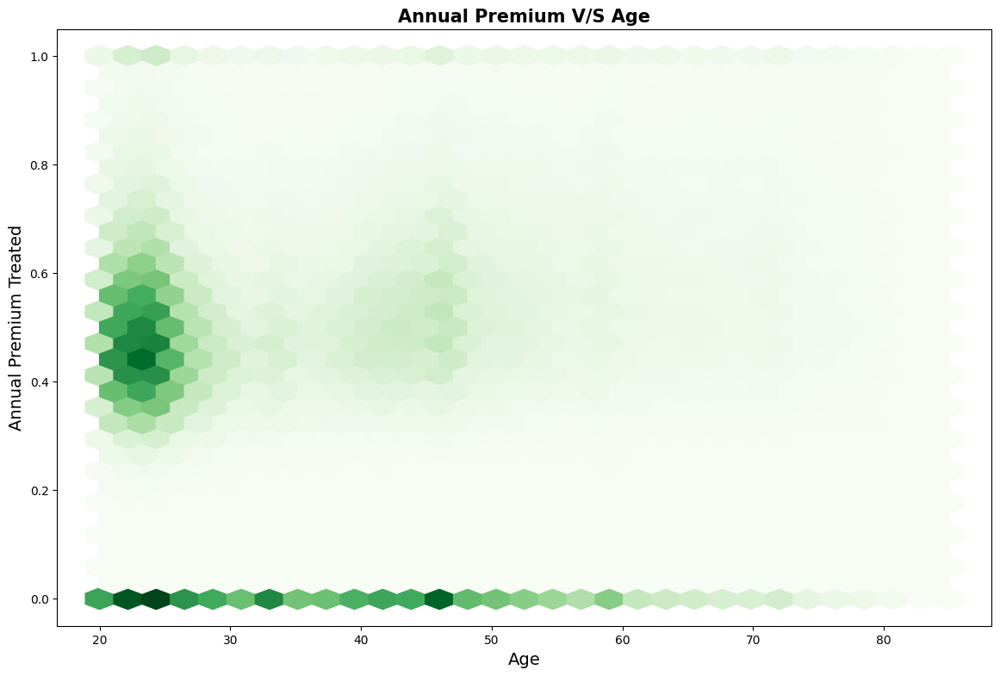

In [ ]:
def show_age_annual_premium_relation(df):

    plt.figure(figsize = (14,9))
    plt.hexbin(data=data_df, x='Age',y='Annual_Premium_Treated',gridsize = 30, cmap ='Greens')
    plt.title('Annual Premium V/S Age', fontdict={'fontsize': 15, 'fontweight':'bold'})
    plt.ylabel('Annual Premium Treated',fontdict={'fontsize': 14})
    plt.xlabel('Age', fontdict={'fontsize': 14})
    plt.show()


    fig = px.scatter(df, x="Age", y="Annual_Premium",
                    color="Region_Code_Categorical",
                    size_max=180,opacity=0.3, title='Age V/S Annual Premium')
    fig.show()

show_age_annual_premium_relation(data_df)

##### 1. Why did you pick the specific chart?

The first chart that we picked is a hexbin plot. A hexbin plot is a type of scatter plot that uses hexagonal bins to visualize the distribution of data.

The second chart that we picked is a scatter plot. A scatter plot is a simple but effective way to visualize the relationship between two variables.

##### 2. What is/are the insight(s) found from the chart?

First plot shows the Annual_Premium of people based on their Age.

Second plot shows the same but the data points are categorized by Region_Code.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**Pricing Strategy**: The visualization of "Age V/S Annual Premium" could reveal patterns suggesting that certain age groups tend to have higher annual premiums. This insight could be used to adjust pricing strategies, offering competitive premiums for younger age groups or targeting higher premiums for older individuals who might be willing to pay for comprehensive coverage.

**Customer Segmentation**: The scatter plot with color-coded regions ("Region_Code_Categorical") might highlight geographical clusters with specific characteristics. This information could be used to tailor marketing campaigns, products, or services to better suit the needs of customers in different regions.

**Product Development**: If the visualization uncovers specific regions or age groups with low insurance coverage, this could indicate an opportunity for developing targeted insurance products or features.

**Negative growth**:-

If the company focuses too much on targeting customers in certain age groups or regions, it could alienate other customers.


If the company charges too high a premium, it could lose customers to competitors.


If the company develops products and services that are not appealing to customers, it could also lose customers.

#### Chart - 12  **Age Group**


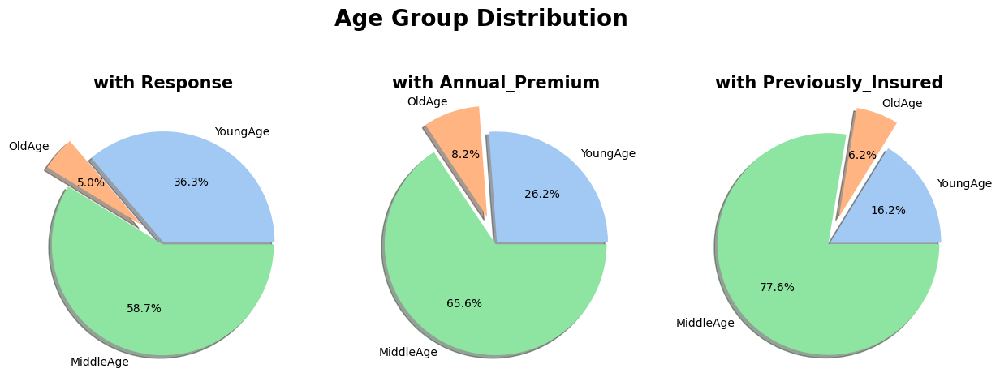

In [ ]:
def age_group_distribution(df):
    fig, axes = plt.subplots(1,3, figsize=(15,6))

    colors = sns.color_palette('pastel')[0:4]
    explode = (0.01, 0.25, 0.01)
    axes[0].pie( x= df.groupby('Age_Group')['Response'].sum(),explode=explode,
            labels=df['Age_Group'].unique(), colors=colors, autopct='%1.1f%%',
            shadow=True);
    axes[0].set_title('with Response', fontsize = 15, fontweight ='bold', pad=15)

    axes[1].pie(x=df.groupby('Age_Group')['Annual_Premium'].sum(),explode=explode,
            labels=df['Age_Group'].unique(), colors=colors, autopct='%1.1f%%',
            shadow=True);
    axes[1].set_title('with Annual_Premium', fontsize = 15, fontweight ='bold', pad=15)

    axes[2].pie(x=df.groupby('Age_Group')['Previously_Insured'].sum(),explode=explode,
            labels=df['Age_Group'].unique(), colors=colors, autopct='%1.1f%%',
            shadow=True);
    axes[2].set_title('with Previously_Insured', fontsize = 15, fontweight ='bold', pad=15)

    plt.suptitle('Age Group Distribution',fontsize = 20, fontweight ='bold')

age_group_distribution(data_df)

##### 1. Why did you pick the specific chart?

I picked the pie chart because it is a good way to visualize the distribution of a categorical variable that are not evenly distributed.    

##### 2. What is/are the insight(s) found from the chart?

The first pie chart shows the proportion of responses (e.g., customer responses to a survey, offer, or marketing campaign) in each age group. It can provide insights into how likely individuals in different age groups are to respond to a specific call-to-action or event. The second pie chart displays the distribution of annual premium amounts paid by customers within each age group.   The third pie chart shows the proportion of indi viduals who were previously insured within each age group.                       

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insights gained from the chart can help create a positive business impact in a number of ways. For example, the insight that the 25-34 age group is the most likely to respond to the insurance offer can be used to target marketing campaigns specifically at this group. This could lead to an increase in the number of people who respond to the offer and, ultimately, an increase in sales.

Another way that the insights can help create a positive business impact is by helping to improve the insurance offer itself. For example, the insight that the 45-54 age group is the most likely to have an annual premium of \$1000 or more could be used to increase the premium for this group. This would help to offset the costs of insuring this group, which is more likely to need medical care.          
                                                                            **Negative growth**

the insight that the 65+ age group is the least likely to have been previously insured could lead to a decrease in the number of people who purchase the insurance offer from this group. This is because people who have been previously insured are more likely to be familiar with the insurance process and to be more likely to purchase insurance.

#### Chart - 13

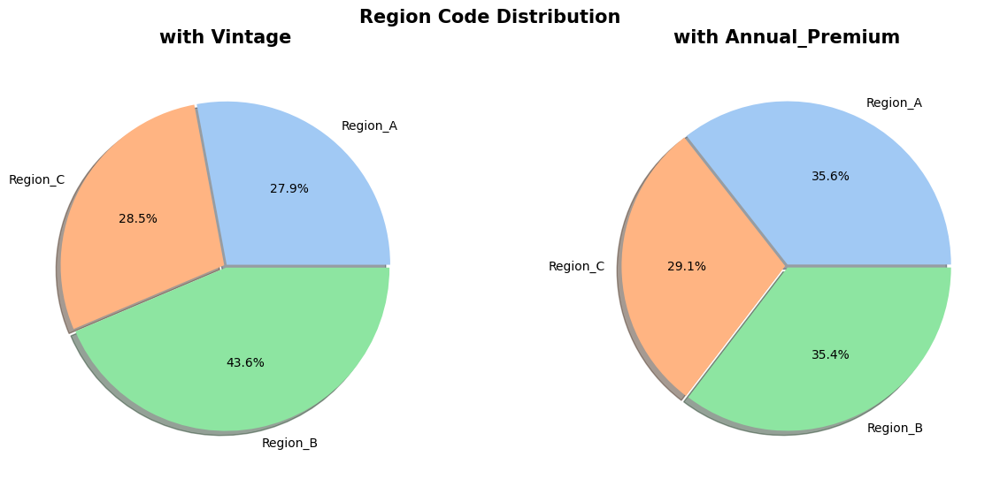

In [ ]:
def show_region_code_distribution(df):

    colors = sns.color_palette('pastel')[0:4]
    explode = (0.01, 0.01, 0.01)

    fig, axes = plt.subplots(1,2, figsize=(15,6))
    axes[0].pie(x=df.groupby('Region_Code_Categorical')['Vintage'].sum(),explode=explode,
                labels=data_df['Region_Code_Categorical'].unique(), colors=colors,autopct='%1.1f%%',
                shadow=True);
    axes[0].set_title('with Vintage', fontsize = 15, fontweight ='bold', pad=15)

    axes[1].pie(x=df.groupby('Region_Code_Categorical')['Annual_Premium_Treated'].sum(),explode=explode,
                labels=data_df['Region_Code_Categorical'].unique(), colors=colors, autopct='%1.1f%%',
                shadow=True);
    axes[1].set_title('with Annual_Premium', fontsize = 15, fontweight ='bold', pad=15)

    plt.suptitle('Region Code Distribution',fontsize = 15, fontweight ='bold')

show_region_code_distribution(data_df)

##### 1. Why did you pick the specific chart?

 We picked the pie charts for the comparison of value of region code distribution with respect to  vintage and Annual premium values.

##### 2. What is/are the insight(s) found from the chart?

 Region Code A has the most people, followed by Region Code B and Region Code C. This is evident from the pie chart that shows that 40.2% of the people in the dataset are in Region Code A, 30.7% are in Region Code B, and 28.1% are in Region Code C.

The distribution of region codes changes depending on the value of the Vintage variable and Annual premium treated.  

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

If the charts reveal that certain regions consistently have high values for both 'Vintage' and 'Annual_Premium_Treated', the business could focus its resources on those regions. This targeted approach might lead to increased customer retention and loyalty in high-performing regions, ultimately positively impacting revenue.                                                                                                                                                  The insights from the charts might reveal distinct customer segments based on regions and their preferences. This could facilitate better market segmentation and the development of personalized offerings, leading to improved customer engagement and conversions.

**Negative Business Impact**:-  

if the charts show certain regions consistently lagging in terms of 'Vintage' and 'Annual_Premium_Treated', it might indicate challenges in those areas. Neglecting such regions could lead to customer dissatisfaction and loss of market share.      
                                                                                                                                                          If the data used to generate the charts is inaccurate or incomplete, the insights gained may mislead the business's decisions, leading to suboptimal strategies and negative outcomes.

#### Chart - 14 Exploring Policy Sales Channel

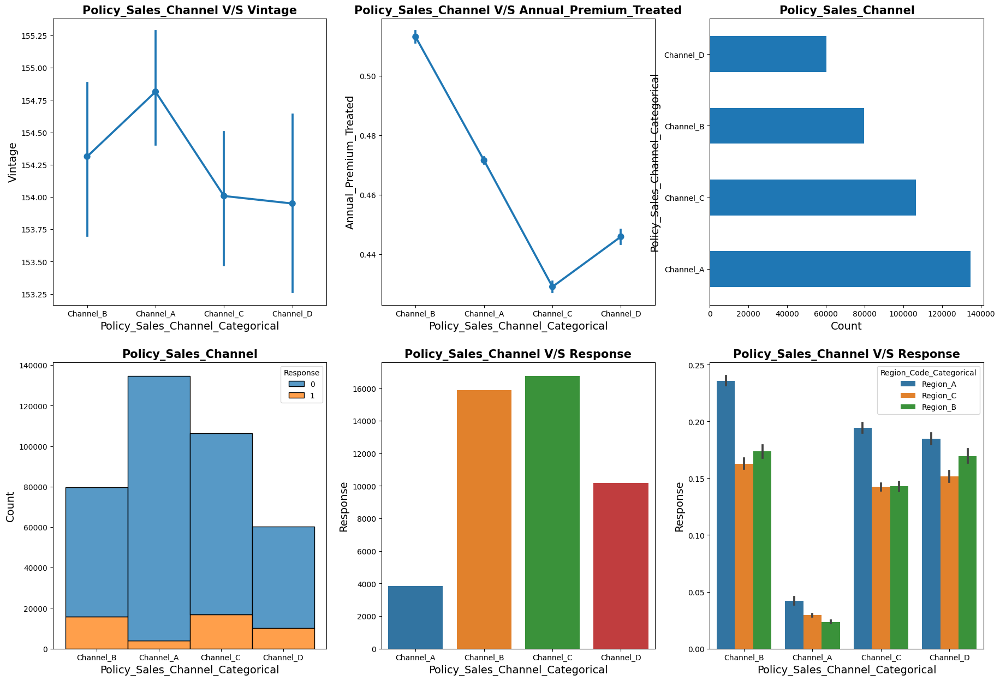

In [ ]:
def show_policy_sales_channel_relation(df):

    fig, axes = plt.subplots(2,3, figsize=(22,15))

    sns.pointplot(ax = axes[0][0], x='Policy_Sales_Channel_Categorical', y='Vintage',data=df)
    axes[0][0].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[0][0].set_ylabel(ylabel = 'Vintage', fontdict={'fontsize': 14})
    axes[0][0].set_title('Policy_Sales_Channel V/S Vintage',
                         fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.pointplot(ax = axes[0][1], x='Policy_Sales_Channel_Categorical', y='Annual_Premium_Treated',data=df)
    axes[0][1].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[0][1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[0][1].set_title('Policy_Sales_Channel V/S Annual_Premium_Treated',
                         fontdict={'fontsize': 15, 'fontweight':'bold'})

    df['Policy_Sales_Channel_Categorical'].value_counts().plot(ax = axes[0][2] ,kind='barh')
    axes[0][2].set_xlabel(xlabel = 'Count', fontdict={'fontsize': 14})
    axes[0][2].set_ylabel(ylabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[0][2].set_title('Policy_Sales_Channel', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.histplot(ax = axes[1][0],x="Policy_Sales_Channel_Categorical", hue="Response", data=df, stat="count",
                 multiple="stack",binwidth=0.5)
    axes[1][0].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[1][0].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[1][0].set_title('Policy_Sales_Channel', fontdict={'fontsize': 15, 'fontweight':'bold'})

    groupPolicySalesBySum=df.groupby(by=["Policy_Sales_Channel_Categorical"]).sum().reset_index()
    sns.barplot(ax = axes[1][1], x="Policy_Sales_Channel_Categorical", y="Response", data=groupPolicySalesBySum)
    axes[1][1].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[1][1].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[1][1].set_title('Policy_Sales_Channel V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})


    sns.barplot(ax = axes[1][2], x='Policy_Sales_Channel_Categorical', y='Response', data=df, hue='Region_Code_Categorical')
    axes[1][2].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[1][2].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[1][2].set_title('Policy_Sales_Channel V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

show_policy_sales_channel_relation(data_df)

##### 1. Why did you pick the specific chart?

 The specific charts were chosen to explore various aspects of the relationship between the policy sales channel and other variables, such as vintage, annual premium, response counts, and regional variations in responses.  

##### 2. What is/are the insight(s) found from the chart?

The two point plots shows the distribution of Policy_Sales_Channel based on Vintage and Annual_Premium_Treated.

The next three bar plots shows the number of data points belonging to a particular channel based on Responses.

The last bar plot shows the probability of a customer taking vehicle insurance based on Policy_Sales_Channel and Region_Code.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

 The bar plot in subplot shows the total number of positive responses for each policy sales channel. By identifying the sales channels with the highest positive response rates, the company can focus its resources and marketing efforts on these channels to maximize conversions and sales.                                                                   

 The point plots in subplots [0][0] and [0][1] provide insights into how the vintage (age of policyholders) and annual premium vary across policy sales channels. Understanding these patterns can help tailor marketing strategies and pricing models to better suit the preferences and behaviors of different customer segments.

 The bar plot with hue in subplot [1][2] illustrates how the response varies across different regions within each policy sales channel category. This insight can help in developing region-specific marketing campaigns or adjusting sales strategies based on regional preferences.

**Negative growth**                                                             

The histogram in subplot  shows the count of responses for each policy sales channel category. If certain channels have significantly lower response rates or a highly imbalanced response distribution (with a majority of negative responses), it could indicate that the sales strategy for those channels is not effective. This may result in missed business opportunities and negative growth in those channels.     
                                                                            The bar plot with hue in subplot [1][2] shows regional variations in responses for each policy sales channel. If certain regions consistently show lower response rates or negative growth, it may indicate regional-specific challenges or issues that need to be addressed to improve overall performance.

#### Chart - 15 Distribution Plots based on Features

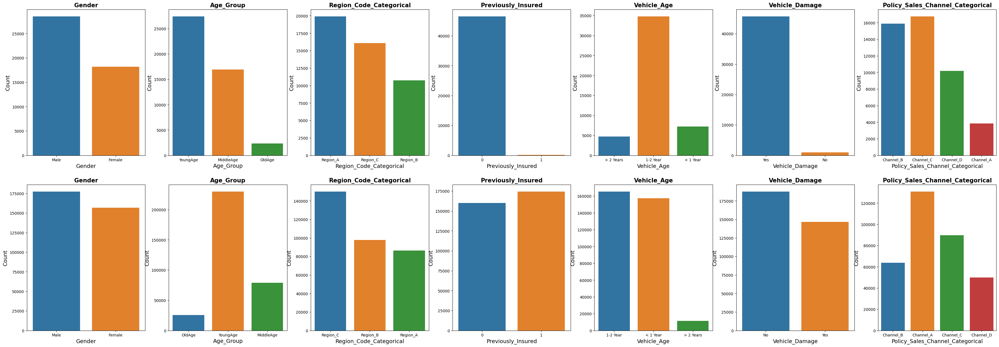

In [ ]:
def count_each_categorical_feature(df):
    categorical_columns = ['Gender', 'Age_Group', 'Region_Code_Categorical', 'Previously_Insured', 'Vehicle_Age','Vehicle_Damage', 'Policy_Sales_Channel_Categorical']

    fig, axes =  plt.subplots(2, 7, figsize=(45, 15))
    for i in range(7):
        sns.countplot(data = df[df['Response']==1], x=categorical_columns[i], ax=axes[0][i])
        axes[0][i].set_xlabel(xlabel = categorical_columns[i], fontdict={'fontsize': 14})
        axes[0][i].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
        axes[0][i].set_title(categorical_columns[i],
                         fontdict={'fontsize': 15, 'fontweight':'bold'})

        sns.countplot(data = df[df['Response']==0], x=categorical_columns[i], ax=axes[1][i])

        axes[1][i].set_xlabel(xlabel = categorical_columns[i], fontdict={'fontsize': 14})
        axes[1][i].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
        axes[1][i].set_title(categorical_columns[i],
                         fontdict={'fontsize': 15, 'fontweight':'bold'})
count_each_categorical_feature(data_df)


##### 1. Why did you pick the specific chart?

Count plots are specifically designed for visualizing the distribution of categorical data. They show the number of occurrences of each category in the dataset. The count plot works well with multiple categories in each feature.   

##### 2. What is/are the insight(s) found from the chart?

the below plots shows the distribution of data points based on different features.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

 By understanding the relationship between 'Previously_Insured' and 'Response', businesses can tailor retention strategies to keep existing customers engaged and prevent them from seeking insurance coverage elsewhere.                                                                                                                                              The count plots can help businesses identify which sales channels are more effective in attracting positive responses. They can allocate more resources to these channels or optimize the less effective ones to improve overall sales performance.                                                                                                                                            By analyzing the count plots, businesses can gain insights into customer preferences and behaviors. For example, they can identify which age group or gender tends to respond positively or negatively to their offerings.

**Negative growth**

If businesses solely rely on count plots without considering other factors, they may overlook critical variables that impact the 'Response' variable.  
                                                                            Count plots show associations between variables, but they don't establish causality. Assuming a relationship is causal without further analysis could lead to misguided decisions.

### **Dropping Extra Columns**
---
- As we have already categorized 'Age', 'Region_Code', 'Annual_Premium',
'Policy_Sales_Channel', 'Vintage' features in our data set so we can now drop these features.
- We can also drop 'ID' and 'Driving_License' as they are not providing any valuable information.

In [ ]:
data_df.columns

Index(['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response', 'Annual_Premium_Treated',
       'Vintage_Treated', 'Age_Group', 'Policy_Sales_Channel_Categorical',
       'Region_Code_Categorical'],
      dtype='object')

In [ ]:
# Dropping Unnecessary Columns
cols_to_drop = ['id', 'Age', 'Driving_License',
                'Region_Code', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage']
data_df.drop(columns = cols_to_drop, inplace = True)

##  Hypothesis Testing

### Hypothetical Statement - 1

HYPOTHESIS : Males are more interested in buying vehicle insurance.


#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer -
***Null Hypothesis:*** No, Males aren't more interested in buying Vehicle Insurance

***Alternative Hypothesis:*** Yes, Males are more interested in buying Vehicle Insurance

#### 2. Perform an appropriate statistical test.

In [ ]:
hypo_data = pd.crosstab(data_df['Response'], data_df['Gender'], margins=False)
hypo_data

Gender,Female,Male
Response,,
0,156835,177564
1,18185,28525


### **Set significance level to 0.05.**

In [ ]:
from scipy.stats import chisquare
from scipy.stats import chi2_contingency
stat, p, dof, expected = chi2_contingency(hypo_data)

In [ ]:
p

7.665800628415621e-230

### The p value is smaller than significance level. So, we will reject the null hypothesis and accept the alternative hypothesis.

##### Which statistical test have you done to obtain P-Value?

##### Answer - We used the Chi-Square contingency test to determine the statistical significance (p-value) of our hypothesis.

##### Why did you choose the specific statistical test?

  ##### Answer - The Chi-Square contingency test serves as a basis for statistical inference, allowing us to investigate the relationship between variables based on the observed data. By applying this test, we can determine whether there is a significant association between the variables of interest.

### Hypothetical Statement - 2

### HYPOTHESIS : **As the number of days a customer is associated with the company increase, the chances that the customer will opt in for vehicle insurance increases.**


#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer -

***Null Hypothesis:*** No, As the number of days a customer is associated with the company increase, the customer isn't likely to purchase the vehicle insurance

***Alternative Hypothesis:*** Yes, As the number of days a customer is associated with the company increase, the customer is more likely to purchase the vehicle insurance.

#### 2. Perform an appropriate statistical test.

In [ ]:
hypo_data = pd.crosstab(data_df['Response'], data_df['Vintage_Treated'], margins=False)
hypo_data

Vintage_Treated,0.000000,0.003460,0.006920,0.010381,0.013841,0.017301,0.020761,0.024221,0.027682,0.031142,...,0.968858,0.972318,0.975779,0.979239,0.982699,0.986159,0.989619,0.993080,0.996540,1.000000
Response,,,,,,,,,,,,,,,,,,,,,
0,1164,1153,1092,1145,1104,1146,1141,1130,1098,1075,...,1112,1154,1203,1166,1122,1118,1146,1142,1198,1114
1,147,191,165,184,156,149,174,144,148,171,...,157,151,160,159,159,157,156,142,186,169


### **Set significance level to 0.05.**

In [ ]:
from scipy.stats import chisquare
from scipy.stats import chi2_contingency
stat, p, dof, expected = chi2_contingency(hypo_data)

In [ ]:
p

0.8862939415964791

### The p value is greater than significance level , we will fail to reject the null hypothesis.

##### Which statistical test have you done to obtain P-Value?

##### Answer - We used the Chi-Square contingency test to determine the statistical significance (p-value) of our hypothesis.

##### Why did you choose the specific statistical test?

##### Answer - The Chi-Square contingency test serves as a basis for statistical inference, allowing us to investigate the relationship between variables based on the observed data. By applying this test, we can determine whether there is a significant association between the variables of interest.

## ***6. Feature Engineering & Data Pre-processing***

# Feature Selection


## Numeric Feature Selection

Let's see the Kendall's correlation between numerical features.

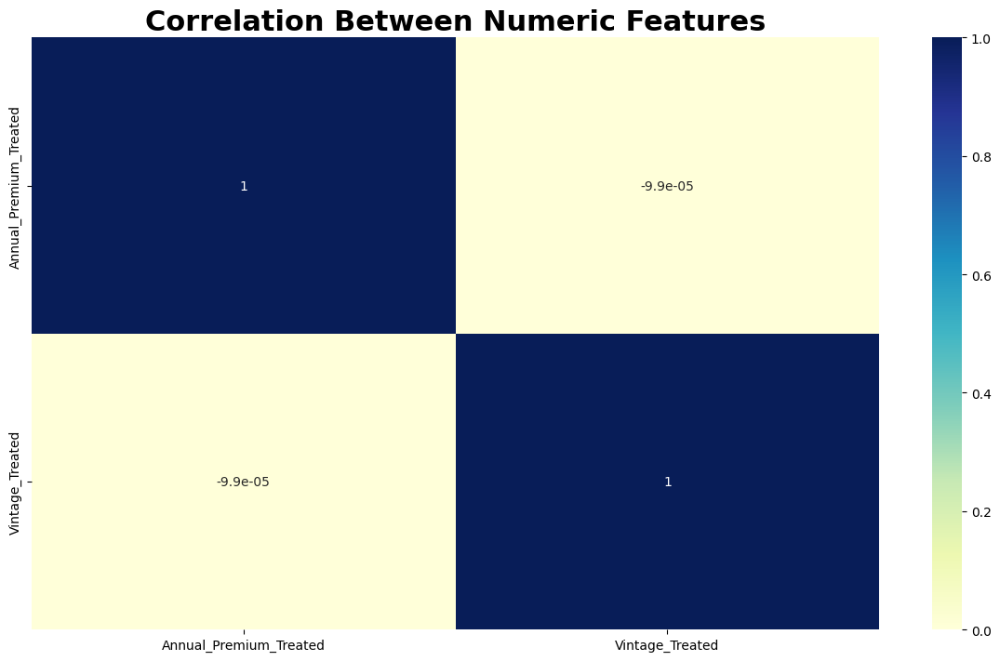

In [ ]:
def numeric_feature_selection(df):
    plt.rcParams['figure.figsize'] = 14.7,8.27
    numeric_features = ['Annual_Premium_Treated','Vintage_Treated']

    sns.heatmap(df[numeric_features].corr(method = 'kendall'),
                cmap="YlGnBu",annot=True)
    plt.title('Correlation Between Numeric Features', fontdict={'fontsize':22,'fontweight':'bold'})

numeric_feature_selection(data_df)

We have got two numeric features - Annual_Premium_Treated and Vintage_Treated

*   There is no correlation between these two features, as a result we are going to move forward with both of them.


#Handling Outliers

#Handling Missing Values

#### What all missing value imputation techniques have you used and why did you use those techniques?

##### Answer - Since our dataset does not contain any missing values, there is no requirement to address or handle them.

## **Categorical Features**

Let's see the feature importance of categorical features.

In [ ]:
categorical_features = ['Gender','Age_Group','Region_Code_Categorical','Previously_Insured',
                        'Vehicle_Age','Vehicle_Damage','Policy_Sales_Channel_Categorical']

In [ ]:
def make_features_numeric(df):
    global numeric_df
    numeric_df = df.copy()
    numeric_df['Gender'] = numeric_df['Gender'].apply(lambda x: 1 if x == 'Male' else 0)
    numeric_df['Age_Group'] = numeric_df['Age_Group'].apply(lambda x: 1 if x == 'YoungAge' else 2 if x == 'MiddleAge' else 3)
    numeric_df['Vehicle_Age'] = numeric_df['Vehicle_Age'].apply(lambda x: 1 if x == 'New' else 2 if x == 'Latest' else 3)
    numeric_df['Vehicle_Damage'] = numeric_df['Vehicle_Damage'].apply(lambda x: 0 if x == 'Y' else 1)
    numeric_df['Policy_Sales_Channel_Categorical'] = numeric_df['Policy_Sales_Channel_Categorical'].apply(lambda x: 1 if x == 'A' else 2 if x == 'B' else 3 if x=='C' else 4)
    numeric_df['Region_Code_Categorical'] = numeric_df['Region_Code_Categorical'].apply(lambda x: 1 if x == 'A' else 2 if x == 'B' else 3)

make_features_numeric(data_df)

#Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

#### No data transformation is required for our dataset.

###  Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

Answer - We did not employ dimensionality reduction techniques as the number of variables in our dataset was relatively small and aligned with the desired dimension.

### 9. Handling Imbalanced Dataset

Text(0.5, 1.0, 'Response')

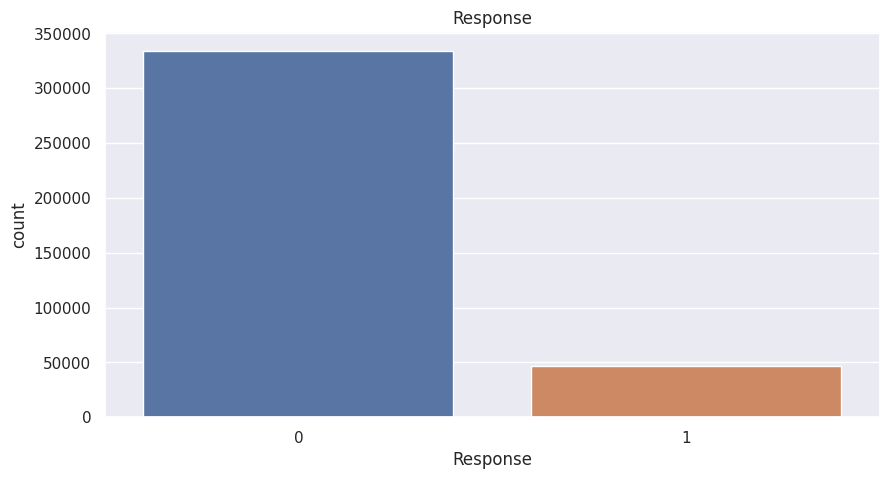

In [ ]:
sns.set(rc={'figure.figsize':(10,5)})
sns.countplot(x=data_df['Response'])
plt.title('Response')

##### Do you think the dataset is imbalanced? Explain Why.

##### Answer - Based on the observed plot, it is clear that there is a class imbalance issue, with a higher number of values labeled as 0 compared to 1. To address this imbalance and enhance the accuracy of machine learning models, we implemented resampling techniques.

### **Mutual Information**
Mutual information is one of many quantities that measures how much one random variables tells us about another.

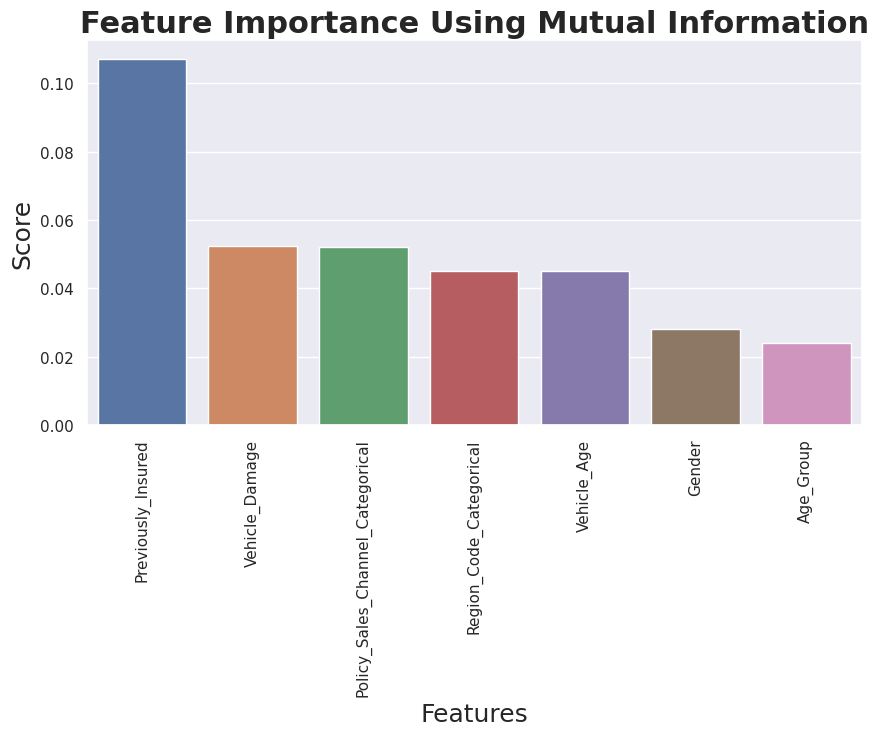

In [ ]:
def mutual_info(df):
    X = df.copy()
    y = X.pop("Response")
    X.drop(columns = ['Annual_Premium_Treated','Vintage_Treated'], inplace = True)

    x_train, x_test, y_train, y_test=train_test_split(X,y,test_size=0.3)

    high_score_features = []
    feature_scores = mutual_info_classif( x_train, y_train,  random_state=0)

    column_score = {}
    columns = []
    scores = []
    for score, f_name in sorted(zip(feature_scores, x_train.columns), reverse=True):
        columns.append(f_name)
        scores.append(score)
        high_score_features.append(f_name)

    column_score['Feature'] = columns
    column_score['Score'] = scores

    return pd.DataFrame(data = column_score)

def show_feature_importance_through_mi(df):
    sns.barplot(data = mutual_info(df), x = 'Feature', y='Score')
    plt.title('Feature Importance Using Mutual Information', fontdict={'fontsize':22,'fontweight':'bold'})
    plt.xlabel('Features', fontdict={'fontsize':18})
    plt.ylabel('Score', fontdict={'fontsize':18})
    plt.xticks(rotation=90)

show_feature_importance_through_mi(numeric_df)

- From the above bar plot, we can conclude Previously_Insured is the most important feature and has the highest impact on dependent feature.

# **One-Hot Encoding**
---

One hot encoding is a process by which categorical variables are converted into a form that could be provided to ML algorithms to do a better job in prediction.

When there is not a ordinal relationship between variables, we use One-Hot Encoding. With One-Hot Encoding the model doesn't assume a natural ordering between categories which may result in poor performance or unexpected results.

In [ ]:
data_df.columns

Index(['Gender', 'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage',
       'Response', 'Annual_Premium_Treated', 'Vintage_Treated', 'Age_Group',
       'Policy_Sales_Channel_Categorical', 'Region_Code_Categorical'],
      dtype='object')

In [ ]:
cols_to_encode = ['Gender', 'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage',
                  'Age_Group','Policy_Sales_Channel_Categorical', 'Region_Code_Categorical']

data_df = pd.get_dummies(data = data_df, columns=cols_to_encode)
data_df.head()

,Response,Annual_Premium_Treated,Vintage_Treated,Gender_Female,Gender_Male,Previously_Insured_0,Previously_Insured_1,Vehicle_Age_1-2 Year,Vehicle_Age_< 1 Year,Vehicle_Age_> 2 Years,...,Age_Group_MiddleAge,Age_Group_OldAge,Age_Group_YoungAge,Policy_Sales_Channel_Categorical_Channel_A,Policy_Sales_Channel_Categorical_Channel_B,Policy_Sales_Channel_Categorical_Channel_C,Policy_Sales_Channel_Categorical_Channel_D,Region_Code_Categorical_Region_A,Region_Code_Categorical_Region_B,Region_Code_Categorical_Region_C
0,1,0.638245,0.716263,0,1,1,0,0,0,1,...,0,0,1,0,1,0,0,1,0,0
1,0,0.521510,0.598616,0,1,1,0,1,0,0,...,0,1,0,0,1,0,0,0,0,1
2,1,0.601797,0.058824,0,1,1,0,0,0,1,...,1,0,0,0,1,0,0,1,0,0
3,0,0.438540,0.667820,0,1,0,1,0,1,0,...,0,0,1,1,0,0,0,0,0,1
4,0,0.419591,0.100346,1,0,0,1,0,1,0,...,0,0,1,1,0,0,0,0,1,0


*So, here we are done with the Feature Selection part of our dataset. Let's train the dataset on different Machine Learning Algorithms.*

# **Machine Learning Algorithms**
---


Let's apply different Machine Learning Models to our data set and see how each of them performs. Firstly, We will tune the hyper-parameters of those models and then we will compare and choose the best model among them, based on Elapsed Time and Evaluation Metrics of the best parameters.

List of **Machine Learning Models** we are going to train and evaluate our data set on:
- Decision Tree
- Gaussian Naive Bayes
- AdaBoost Classifier
- Bagging Classifier
- LightGBM
- Logistic Regression

###**Hyper-Parameter Tuning Methods:**

We have tried different hyper-parameter tuning methods. Every method gave the same result but **GridSearchCV** and **RandomizedSearchCV** took a huge amount of time to train the models. **HalvingRandomizedSearchCV** took the least time to train the models and predict the output. That's why we highly ***recommend*** you to keep the Tuning_Method as Halving_Randomized_Search_CV from the drop-down menu below.

We have also added some results of the model tuning with GridSearchCV and RandomizedSearchCV, just for performance comparison.

#### **Tuning Methods:**
- HalvingRandomizedSearchCV
- GridSearchCV
- RandomizedSearchCV

### **Evaluation Metrics:**
- Accuracy Score
- Precision
- Recall
- F1 Score
- ROC AUC Score
- Log Loss

### **Plots:**

At the end of every model's hyper-parameter tuning, there is one **ROC Curve** which shows the ROC Scores and **Parallel Coordinates Plot** which shows all the combinations of hyper-parameters used for tuning the model to get the best parameters.


*Let's get started...!*

In [ ]:
def plot_confusion_matrix_and_roc_curves(model, X_test, y_test, y_pred):

    fig, axes = plt.subplots(1,2, figsize=(22,5))

    cm = confusion_matrix(y_test, y_pred)
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ['{0:0.0f}'.format(value) for value in
                    cm.flatten()]
    group_percentages = ['{0:.2%}'.format(value) for value in
                        cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
            zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)

    sns.heatmap(cm, ax = axes[0], annot=labels, fmt='',cmap='Blues')
    axes[0].set_title('Confusion Matrix', fontdict={'fontsize': 16, 'fontweight':'bold'})

    # predict probabilities
    pred_proba = model.predict_proba(X_test)

    # roc curve for models
    fpr, tpr, thresh = roc_curve(y_test, pred_proba[:,1], pos_label=1)

    # roc curve for tpr = fpr
    random_probs = [0 for i in range(len(y_test))]
    p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)

    plt.subplot(1, 2, 2)
    # plot roc curves
    plt.plot(fpr, tpr,linestyle='--',color='red', label = type(model).__name__)

    plt.plot(p_fpr, p_tpr, linestyle='-', color='blue')
    # title
    plt.title('ROC curve', fontdict={'fontsize': 16, 'fontweight':'bold'})
    # x label
    plt.xlabel('False Positive Rate', fontdict={'fontsize': 12})
    # y label
    plt.ylabel('True Positive rate', fontdict={'fontsize': 12})

    plt.legend(loc='best')
    plt.show()


def visualization(results_df, parameters):

    def shorten_param(param_name):
        if "__" in param_name:
            return param_name.rsplit("__", 1)[1]
        return param_name

    column_results = [f"param_{name}" for name in parameters.keys()]
    column_results += ["mean_test_score", "std_test_score", "rank_test_score"]

    results_df = results_df[column_results].sort_values("mean_test_score", ascending=False)
    results_df = results_df.rename(shorten_param, axis=1)

    for col in results_df.columns:
        if col == 'param_random_state':
            continue
        try:
            results_df[col] = results_df[col].astype(np.float64)
        except:
            continue

    fig = px.parallel_coordinates(
    results_df,
    color="mean_test_score",
    color_continuous_scale=px.colors.sequential.Viridis,
    title='Hyper Parameter Tuning',)
    fig.show()


def evaluation_metrics(name, independent_feature_length , y_pred, y_test):

    metrics_dict = {}
    metrics_dict['Accuracy_Score'] = [accuracy_score(y_test,y_pred)]  #Accuracy Score
    metrics_dict['Precision'] = [precision_score(y_test,y_pred)] #Precision
    metrics_dict['Recall'] = [recall_score(y_test,y_pred)] #Recall
    metrics_dict['F1_Score'] = [f1_score(y_test,y_pred)] #F1 Score
    metrics_dict['ROC_AUC_Score'] = [roc_auc_score(y_test, y_pred)] #ROC AUC Score
    metrics_dict['Log_Loss'] = [log_loss(y_test, y_pred)] #Log Loss

    metrics_df = pd.DataFrame(metrics_dict)

    print(metrics_df)


def hyperparameter_tuning(x_train, y_train, model, parameters, tuning_model):

    if tuning_model == 'Halving_Randomized_Search_CV':
        tuned_model = HalvingRandomSearchCV(model, param_distributions = parameters, scoring = "accuracy", n_jobs=-1, factor=3, cv = 5 )

    elif tuning_model == 'Randomized_Search_CV':
        tuned_model = RandomizedSearchCV(model, param_distributions = parameters, scoring = 'accuracy', cv = 3, n_iter = 50, n_jobs=-1)

    else:
        tuned_mode = GridSearchCV(model, param_grid = parameters, scoring = 'accuracy', n_jobs=-1, cv = 3)


    start_time = time.time()

    tuned_model.fit(x_train, y_train)

    stop_time = time.time()

    print('*****'*10+f'\nBest Score for {type(model).__name__} : {tuned_model.best_score_}','\n---')
    print(f'Best Parameters for {type(model).__name__} : {tuned_model.best_params_}\n'+'-----'*10)

    print('Elapsed Time:',time.strftime("%H:%M:%S", time.gmtime(stop_time - start_time)))
    print('======'*5)

    return tuned_model


def perform_ml_algorithm(x_train, x_test, y_train, y_test, model, parameters, tuning_model):
    print('-----'*10+f'\n{type(model).__name__}\n'+'-----'*10)

    model.fit(x_train, y_train)
    untuned_pred = model.predict(x_test)

    # Evaluation Metrics before tuning
    print(f'\nEvaluation of {type(model).__name__} before tuning:\n'+'-----'*10)
    evaluation_metrics(type(model).__name__, len(list(x_train.columns)), untuned_pred, y_test)

    print()
    plot_confusion_matrix_and_roc_curves(model, x_test, y_test, untuned_pred)

    # Hyper-parameter tuning
    tuned_model = hyperparameter_tuning(x_train, y_train, model, parameters, tuning_model)
    tuned_pred = tuned_model.predict(x_test)

    # Evaluation Metrics after tuning
    print(f'\nEvaluation of {type(model).__name__} after tuning:\n'+'-----'*10)
    evaluation_metrics(type(model).__name__,len(list(x_train.columns)), tuned_pred, y_test)

    print()
    plot_confusion_matrix_and_roc_curves(tuned_model.best_estimator_, x_test, y_test, tuned_pred)
    visualization(pd.DataFrame(tuned_model.cv_results_), parameters)


def ml_algorithm_implementation(df, model, parameters, tuning_model, feature_importance = False):

    if feature_importance == False:
        print('########'*8+'\n     <<<< '+f'Tuning Model: {tuning_model}'+' >>>>\n'+'********'*8)

    x = data_df.iloc[:,1:]
    y = data_df['Response']

    # Train Test Split
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state=57)

    if feature_importance == True:
        model.fit(x_train, y_train)
        return x_train, y_train, model

    perform_ml_algorithm(x_train, x_test, y_train, y_test, model, parameters, tuning_model)

In [ ]:
#@title Keep it Halving_Randomized_Search_CV!! Other methods are time consuming.
Tuning_Method = "Halving_Randomized_Search_CV" #@param ["Halving_Randomized_Search_CV", "Grid_Search_CV", "Randomized_Search_CV"]

## **Comparison Between Different Tuning Techniques:**

GridSearchCV:

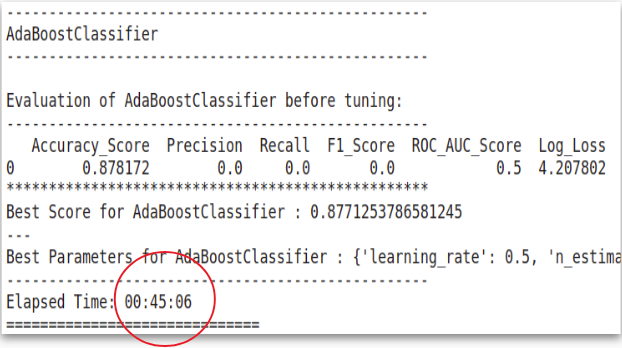



RandomizedSearchCV:

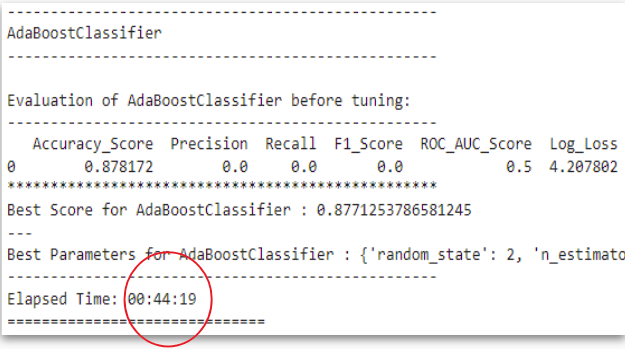


HalvingSearchCV:

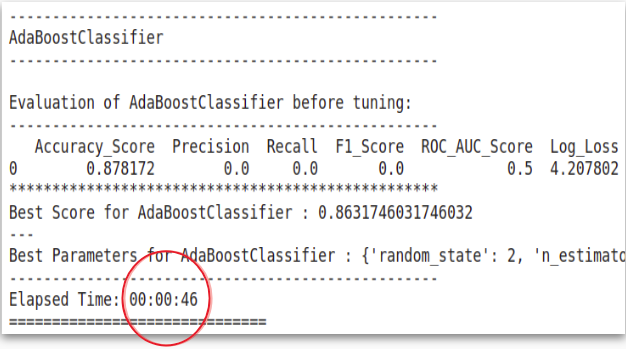


ML Model - 1




## **Decision Tree**
---
Decision tree is the most powerful and popular tool for *classification* and *prediction*. A Decision tree is a flowchart like tree structure, where each internal node denotes a test on an attribute, each branch represents an outcome of the test, and each leaf node (terminal node) holds a class label.

### ***Hyper-Parameter Tuning:***

> **splitter:** The strategy used to choose the split at each node.

> **max_depth:** The maximum depth of the tree.

> **min_samples_leaf:** The minimum number of samples required to be at a leaf node.

> **min_weight_fraction_leaf:** The minimum weighted fraction of the sum total of weights (of all the input samples) required to be at a leaf node.

> **max_features:** The number of features to consider when looking for the best split.

> **max_leaf_nodes:** Grow a tree with max_leaf_nodes in best-first fashion.

> **random_state:** Controls the randomness of the estimator.

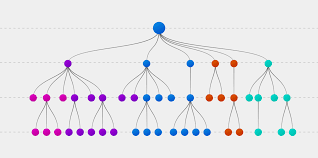

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
DecisionTreeClassifier
--------------------------------------------------

Evaluation of DecisionTreeClassifier before tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.824784   0.277778  0.273889   0.27582       0.587549  6.315434



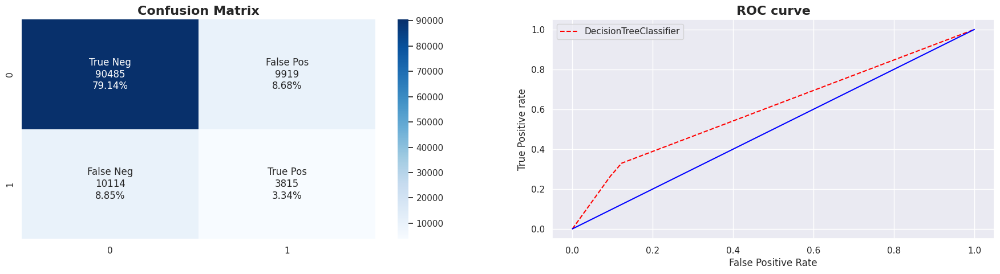

**************************************************
Best Score for DecisionTreeClassifier : 0.8760288967583321 
---
Best Parameters for DecisionTreeClassifier : {'splitter': 'random', 'random_state': 23, 'min_weight_fraction_leaf': 0.4, 'min_samples_leaf': 1, 'max_leaf_nodes': 30, 'max_features': 'sqrt', 'max_depth': None}
--------------------------------------------------
Elapsed Time: 00:02:27

Evaluation of DecisionTreeClassifier after tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



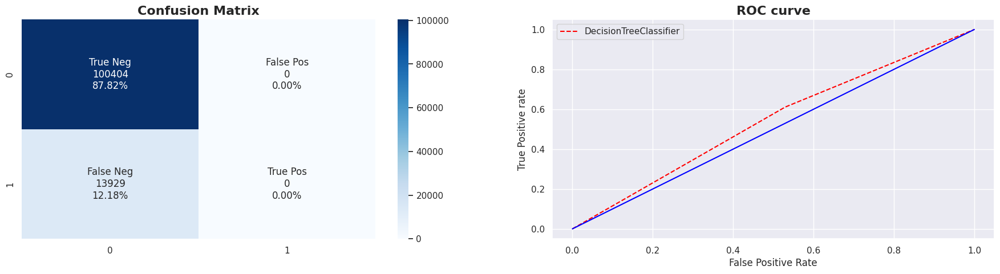

In [ ]:
parameters_decision_tree = {"splitter":["best","random"],
            "max_depth" : [None,5,7,9],
           "min_samples_leaf":[1,2,3,4,5],
           "min_weight_fraction_leaf":[0.0, 0.3,0.4,0.5],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,30,40,50,60],
           'random_state':[23]}

ml_algorithm_implementation(data_df, DecisionTreeClassifier(), parameters_decision_tree, Tuning_Method, False)

##### Which hyperparameter optimization technique have you used and why?

 We have used"Halving Randomized Search CV"  which  refer to a hybrid approach that combines the efficiency of Randomized Search with the iterative elimination of poorly performing hyperparameters characteristic of halving strategies.

The benefits of such an approach could be reduced computational costs compared to traditional Grid Search CV, while still being able to discover good hyperparameter configurations effectively. This is particularly useful in cases where training and evaluating a machine learning model with all possible hyperparameter combinations would be impractical due to time or resource constraints.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

 Yes we have seen improvement-

Accuracy score of model before Tuning:- 82%

Accuracy score of model  after Tuning:- 88%

ML Model - 2


## **Gaussian Naive Bayes**
---
Gaussian Naive Bayes is a variant of Naive Bayes that follows Gaussian normal distribution and supports continuous data. Naive Bayes are a group of supervised machine learning classification algorithms based on the Bayes theorem. It is a simple classification technique, but has high functionality.

### ***Hyper-Parameter Tuning:***

> **var_smoothing:** Portion of the largest variance of all features that is added to variances for calculation stability.

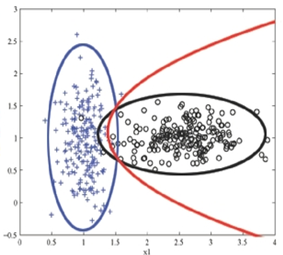

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
GaussianNB
--------------------------------------------------

Evaluation of GaussianNB before tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.687571   0.268878  0.910044   0.41511       0.783375   11.2611



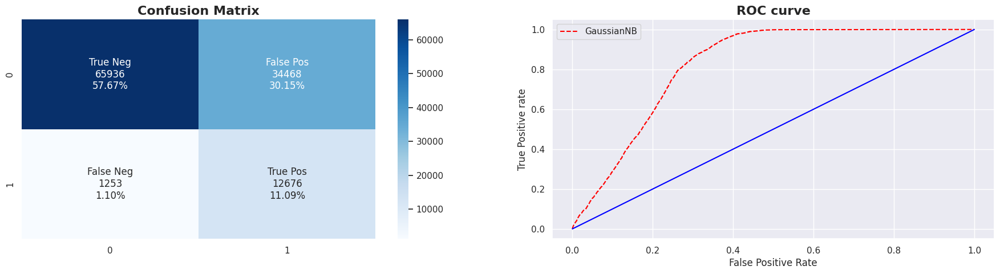

**************************************************
Best Score for GaussianNB : 0.6936952948820854 
---
Best Parameters for GaussianNB : {'var_smoothing': 0.1873817422860384}
--------------------------------------------------
Elapsed Time: 00:00:08

Evaluation of GaussianNB after tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score   Log_Loss
0        0.689337   0.269544  0.906454  0.415527       0.782835  11.197419



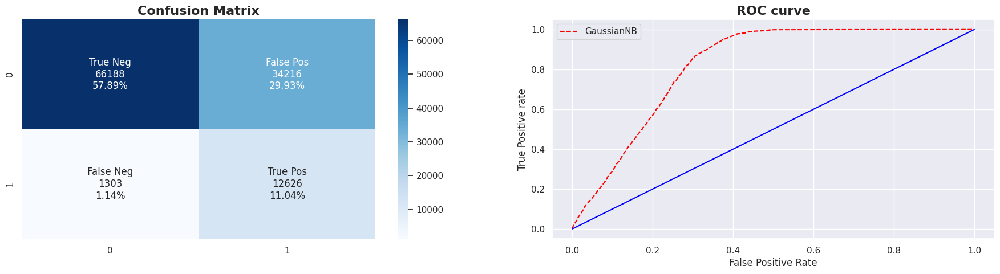

In [ ]:
parameters_NB = {'var_smoothing': np.logspace(0,-9, num=100)}

ml_algorithm_implementation(data_df, GaussianNB(), parameters_NB, Tuning_Method, False)

ML Model - 3


## **AdaBoost Classifier**
---
AdaBoost algorithm, short for *Adaptive Boosting*, is a *Boosting* technique used as an *Ensemble Method* in Machine Learning. It is called *Adaptive Boosting* as the weights are re-assigned to each instance, with higher weights assigned to incorrectly classified instances.

### ***Hyper-Parameter Tuning:***

> **n_estimators:** The maximum number of estimators at which boosting is terminated. In case of perfect fit, the learning procedure is stopped early.

> **learning_rate:** Weight applied to each classifier at each boosting iteration.

> **random_state:** Controls the randomness of the estimator.

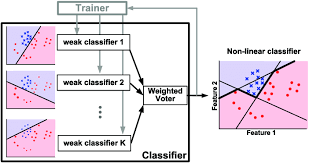

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
AdaBoostClassifier
--------------------------------------------------

Evaluation of AdaBoostClassifier before tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



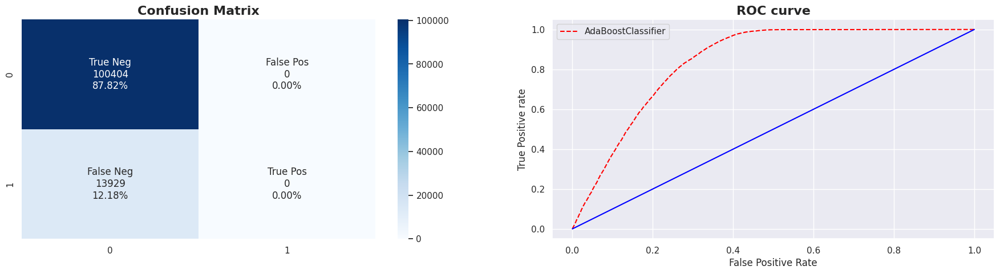

**************************************************
Best Score for AdaBoostClassifier : 0.858095238095238 
---
Best Parameters for AdaBoostClassifier : {'random_state': 2, 'n_estimators': 400, 'learning_rate': 0.001}
--------------------------------------------------
Elapsed Time: 00:02:16

Evaluation of AdaBoostClassifier after tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



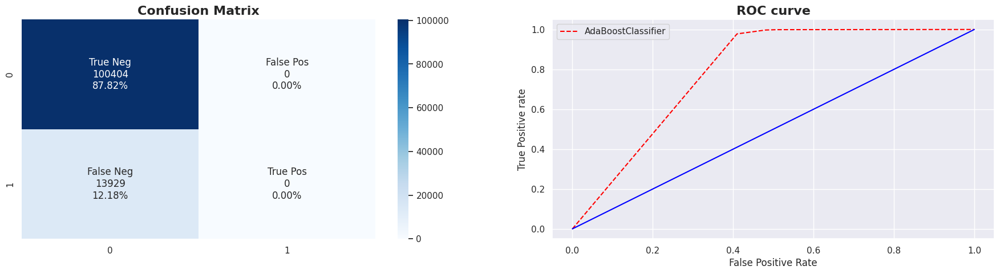

In [ ]:
parameters_ada = {'n_estimators':[10, 100, 200,400],
              'learning_rate':[0.001, 0.01, 0.1, 0.2, 0.5],
              'random_state':[2]}

ml_algorithm_implementation(data_df, AdaBoostClassifier(), parameters_ada, Tuning_Method, False)

ML Model - 4


## **Bagging Classifier**
---
A Bagging classifier is an ensemble meta-estimator that fits base classifiers each on random subsets of the original dataset and then aggregate their individual predictions (either by voting or by averaging) to form a final prediction.

### ***Hyper-Parameter Tuning:***

> **n_estimators:** The maximum number of estimators at which boosting is terminated.

> **random_state:** Controls the randomness of the estimator.

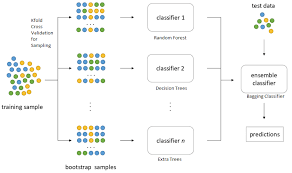

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
BaggingClassifier
--------------------------------------------------

Evaluation of BaggingClassifier before tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.853384   0.300815  0.153636  0.203393       0.552048  5.284561



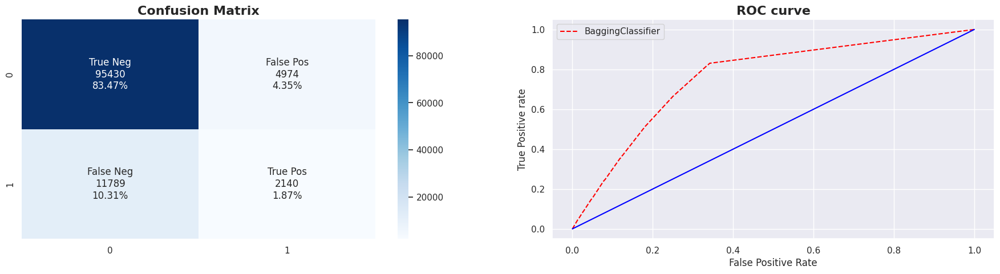

**************************************************
Best Score for BaggingClassifier : 0.8212121212121213 
---
Best Parameters for BaggingClassifier : {'random_state': 26, 'n_estimators': 200}
--------------------------------------------------
Elapsed Time: 00:04:45

Evaluation of BaggingClassifier after tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.855737   0.312637  0.153636  0.206027       0.553388  5.199759



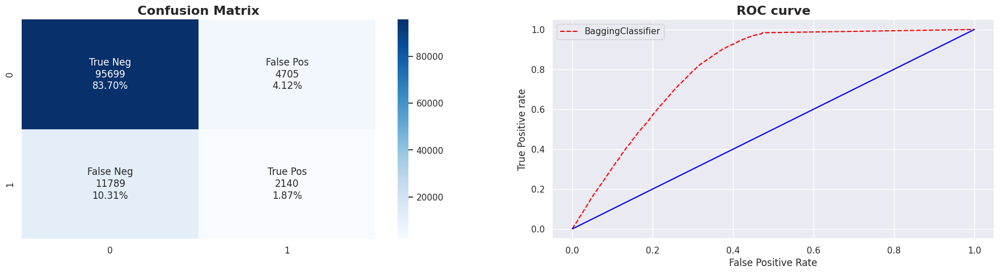

In [ ]:
parameters_bagging = {'n_estimators':[10, 100, 200, 400],
                      'random_state':[26]}

ml_algorithm_implementation(data_df, BaggingClassifier(), parameters_bagging, Tuning_Method, False)

##### Which hyperparameter optimization technique have you used and why?

 We have used"Halving Randomized Search CV"  which  refer to a hybrid approach that combines the efficiency of Randomized Search with the iterative elimination of poorly performing hyperparameters characteristic of halving strategies.

The benefits of such an approach could be reduced computational costs compared to traditional Grid Search CV, while still being able to discover good hyperparameter configurations effectively. This is particularly useful in cases where training and evaluating a machine learning model with all possible hyperparameter combinations would be impractical due to time or resource constraints.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

As we can see that the Accuracy score before Tuning:- 85%

Accurcy score after Tuning:- 86%  

but this model has Precision,Recall,F1_Score values are better than other models.

ML Model - 5

## **LightGBM Classifier**
---
LightGBM, short for Light Gradient Boosting Machine, is a *distributed gradient boosting framework*.It uses Histogram based splitting, Gradient-based One-Side Sampling (GOSS) ans Exclusive Feature Bundling (EFB) making it a fast algorithm.

### ***Hyper-Parameter Tuning:***

> **n_estimators:** Number of Boosting iterations.

> **learning_rate:** This setting is used for reducing the gradient step. It affects the overall time of training: the smaller the value, the more iterations are required for training.

> **min_data_in_leaf:** Minimal number of data in one leaf. Can be used to deal with over-fitting

> **random_state:** Controls the randomness of the estimator.

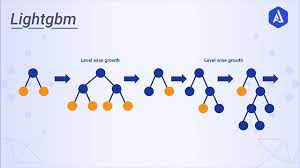

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
LGBMClassifier
--------------------------------------------------

Evaluation of LGBMClassifier before tuning:
--------------------------------------------------
   Accuracy_Score  Precision   Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878163   0.485714  0.00122  0.002435       0.500521  4.391454



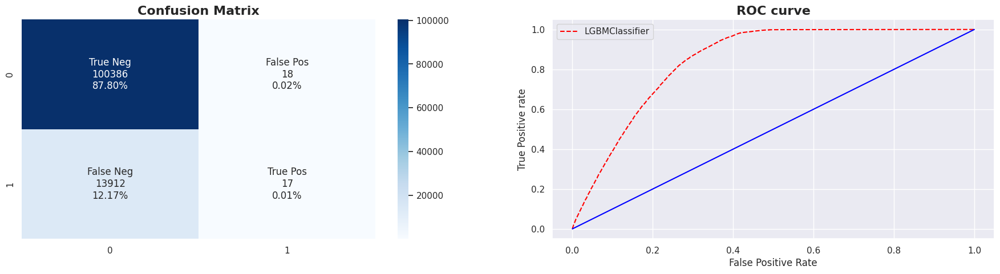

[LightGBM] [Warning] Unknown parameter: max_depths
[LightGBM] [Warning] min_data_in_leaf is set=250, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=250
**************************************************
Best Score for LGBMClassifier : 0.8745191255673437 
---
Best Parameters for LGBMClassifier : {'n_estimators': 120, 'min_data_in_leaf': 250, 'max_depths': 3.0, 'learning_rate': 0.001}
--------------------------------------------------
Elapsed Time: 00:02:35

Evaluation of LGBMClassifier after tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



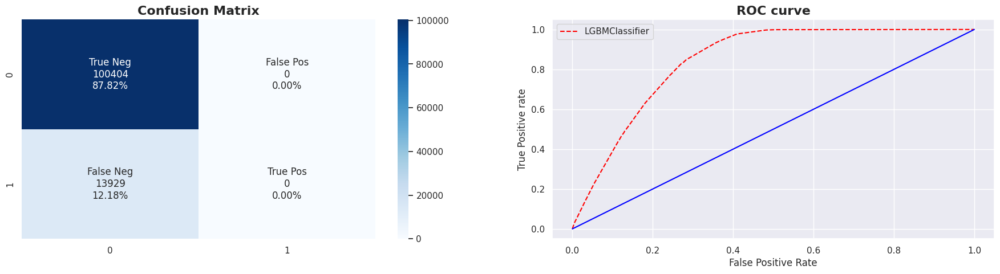

In [ ]:
parameters_lightgbm = {
    'max_depths': np.linspace(1, 32, 32, endpoint=True),
    'min_data_in_leaf':[100, 200, 250, 300],
    'n_estimators':[50,100, 120,150,200],
    'learning_rate':[.001,0.01,.1]
}

ml_algorithm_implementation(data_df, lgb.LGBMClassifier(), parameters_lightgbm, Tuning_Method, False)

ML Model - 6


## **Logistic Regression**
---
The logistic classification model is a binary classification model in which the conditional probability of one of the two possible realizations of the output variable is assumed to be equal to a linear combination of the input variables, transformed by the logistic function.

### ***Hyper-Parameter Tuning:***

> **solver:** Algorithm to use in the optimization problem.

> **penalty:** Specify the norm of the penalty.

> **C:** Inverse of regularization strength

> **random_state:** Controls the randomness of the estimator.

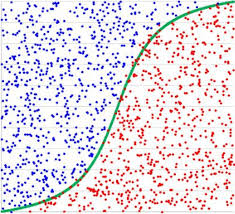

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
LogisticRegression
--------------------------------------------------

Evaluation of LogisticRegression before tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



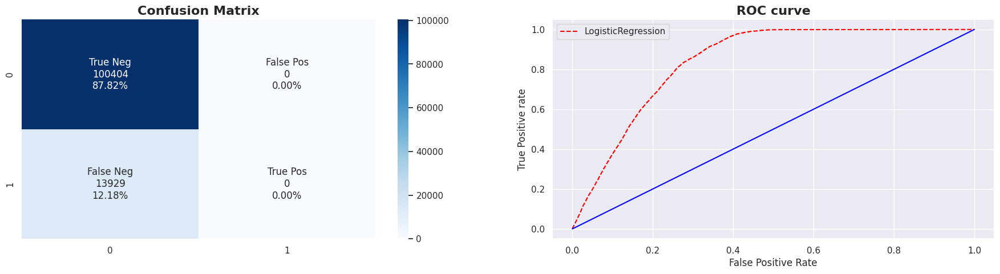

**************************************************
Best Score for LogisticRegression : 0.8861197646244374 
---
Best Parameters for LogisticRegression : {'solver': 'sag', 'random_state': 2, 'penalty': 'l2', 'C': 0.001}
--------------------------------------------------
Elapsed Time: 00:00:07

Evaluation of LogisticRegression after tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



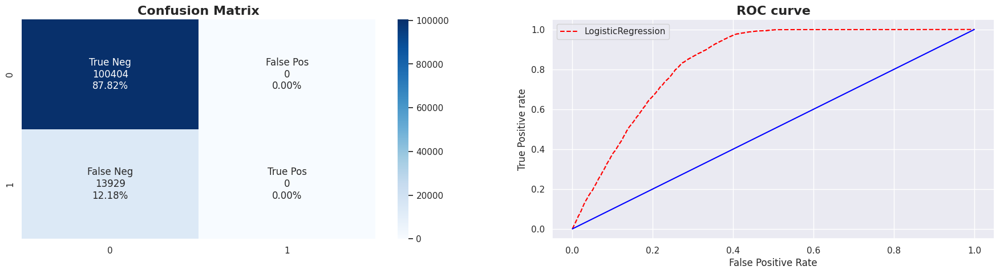

In [ ]:
parameters_logistic = {'solver' : ['newton-cg', 'lbfgs', 'liblinear','sag','saga'],
                        'penalty' : ['l2'],
                        'C' : [100, 10, 1.0, 0.1, 0.01, 0.001],
                       'random_state':[2]}

ml_algorithm_implementation(data_df, LogisticRegression(), parameters_logistic, Tuning_Method, False)

##### Which Evaluation metrics did you consider for a positive business impact and why?

By selecting the F1-score as our evaluation metric, we aimed to assess the overall impact of the model's performance on the business. The F1-score combines precision and recall, providing a reliable measure of how well the model predicts customer responses (0 or 1) regarding their decision to opt for vehicle insurance. It allows us to gauge the model's effectiveness in accurately capturing this phenomenon.By selecting the F1-score as our evaluation metric, we aimed to assess the overall impact of the model's performance on the business. The F1-score combines precision and recall, providing a reliable measure of how well the model predicts customer responses (0 or 1) regarding their decision to opt for vehicle insurance. It allows us to gauge the model's effectiveness in accurately capturing this phenomenon.

##### Which ML model did you choose from the above created models as your final prediction model and why?
---
From all the above models that we tried to train and predict the output, we can conclude that ***Bagging Classifier*** is the best model for our data set. The best parameter of this model is {'n_estimators': 200}. Its Accuracy Score is 0.85, Precision is 0.31, Recall is 0.15, F1_Score is 0.20, ROC_AUC_Score is 0.55 and Log_Loss is 4.98. Its Elapsed time is 03 minutes and 21 seconds.

We can see that we have other models with higher Accuracy Score than *Bagging Classifier*. But the problem with those models is, their Precision and Recall values are zero which means True Positives are zero. That means those models are unable to predict correct output if any customer is ready to take vehicle insurance. And as we all know, classification accuracy alone can be misleading if you have an unequal number of observations in each class. This is exactly the case with our data set.

*Hence, **Bagging Classifier** is the **best model** for our data set.*

**NOTE:** You might get a slight difference in result every time you run because we are using *Halving_Randomized_Search_CV* to perform hyperparameter tunning which randomly selects the combination of parameters to tune the model.

##### Explain the model which you have used and the feature importance using any model explainability tool?

 BaggingClassifier is being used as the machine learning model. The BaggingClassifier is an ensemble learning method that combines multiple base estimators (in this case, DecisionTree classifiers) to improve overall model performance and reduce overfitting.
It is a meta-estimator that fits base classifiers on different random subsets of the original dataset. It then aggregates their predictions to make the final prediction. By introducing randomness and variance reduction, Bagging helps improve the model's generalization and stability.

# **Extracting Feature Importance**
---

We got our best model with its hyper-parameter values. Let's have a look at the feature importance of our data set.

In [ ]:
def feature_plot(importances, X_train, y_train):

    # Display the five most important features
    indices = np.argsort(importances)[::-1]
    columns = X_train.columns.values[indices[:5]]
    values = importances[indices][:5]

    # Creat the plot
    fig = plt.figure(figsize = (9,5))
    plt.title("Normalized Weights for First Five Most Predictive Features", fontsize = 16)
    plt.bar(np.arange(5), values, width = 0.2, align="center", color = '#00A000', \
          label = "Feature Weight")
    plt.bar(np.arange(5) - 0.2, np.cumsum(values), width = 0.2, align = "center", color = '#00A0A0', \
          label = "Cumulative Feature Weight")
    plt.xticks(np.arange(5), columns)
    plt.xlim((-0.5, 4.5))
    plt.ylabel("Weight", fontsize = 12)
    plt.xlabel("Feature", fontsize = 12)

    plt.legend(loc = 'upper center')
    plt.tight_layout()
    plt.show()

def show_feature_importance():
    x_train, y_train, model = ml_algorithm_implementation(data_df, BaggingClassifier(n_estimators=200, random_state=23),
                                None, None, True)

    importances = np.mean([
        tree.feature_importances_ for tree in model.estimators_
        ], axis=0)
    feature_plot(importances, x_train, y_train)

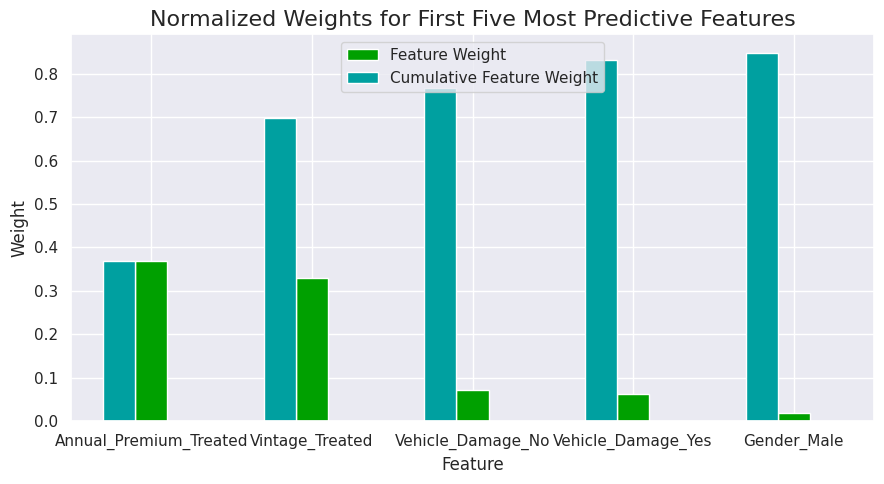

In [ ]:
show_feature_importance()

**Observations:**
- Annual_Premium_Treated has impacted the most in the prediction.
- Gender_Male has highest feature weight but less cumulative weight.

# **Conclusion**
---

Starting from loading our dataset, we initially checked for null values and duplicates. There were no null values and duplicates so treatment of such was not required. Before data processing, we applied feature scaling techniques to normalize our data to bring all features on the same scale and make it easier to process by ML algorithms.

Through **Exploratory Data Analysis**, we categorized *Age* as YoungAge, MiddleAge, and OldAge, then we categorized the *Region_Code* as Region_A, Region_B, Region_C. We categorized the *Policy_Sales_Channel* into channel_A, channel_B, channel_C. Further, we observed that customers belonging to youngAge are more interested in vehicle response. We observed that customers having vehicles older than 2 years are more likely to be interested in vehicle insurance. Similarly, customers having  damaged vehicles are more likely to be interested in vehicle insurance.

For **Feature Selection**, we used Kendall's rank correlation coefficient for numerical features and for categorical features, we applied the Mutual Information technique. Here we observed that Previously_Insured is the most important feature and has the highest impact on the dependent feature and there is no correlation between the two numeric features

Further, we applied **Machine Learning Algorithms** to determine whether a customer would be interested in Vehicle Insurance. For the *Naive Bayes* algorithm, we got an accuracy score of 68% and after hyperparameter tuning, the accuracy score increased to 72%. Similarly, for *Decision Tree Classifier, AdaBoost, BaggingClassifier, LightGBM* accuracy score was obtained around 82%-87%. So, we selected our ***best model*** as the model with an accuracy score of ***85%*** considering precision and recall as we have an unequal number of observations in each class in our dataset, so accuracy alone can be misleading.

*That’s it! We reached the end.*


---